# Recognition tables with text
variant 3

In [1]:
name_jpg = 'sample_3.jpg'

In [2]:
%matplotlib inline
import pytesseract
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
import copy

In [3]:
def show_image (img):
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.show()

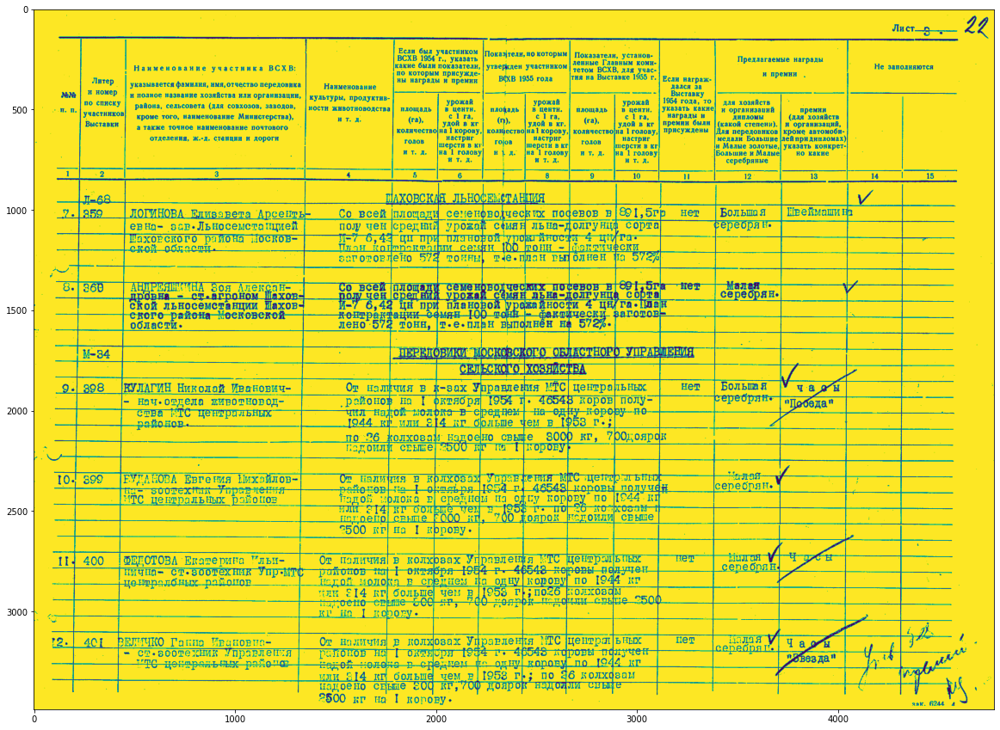

In [4]:
gray = cv2.imread(name_jpg, 0)
# Grayscale picture
#gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# noise cleaning
ret, threshold_gray = cv2.threshold(gray, 120, 255, 0)
show_image(threshold_gray)

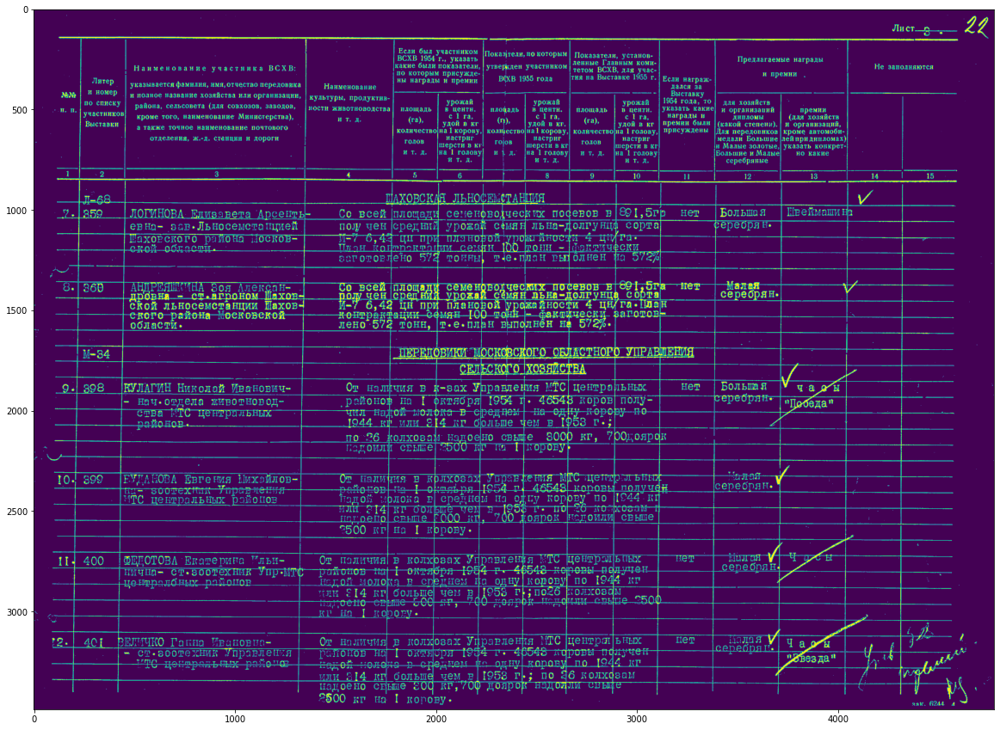

In [5]:
binary = cv2.adaptiveThreshold(~threshold_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 35, -5)
# Show pictures 
show_image(binary)

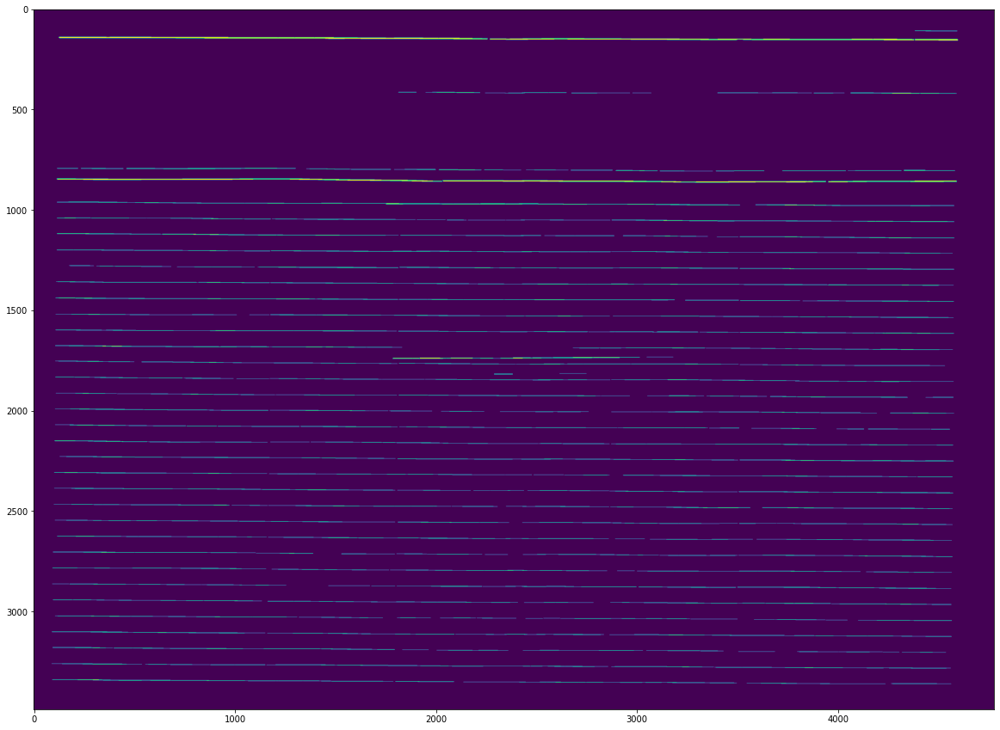

In [6]:
rows, cols = binary.shape
scale = 60
 # Get core value adaptively
 # Identify horizontal lines:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (cols // scale, 1))
eroded = cv2.erode(binary, kernel, iterations=1)
dilated_col = cv2.dilate(eroded, kernel, iterations=1)
show_image(dilated_col)

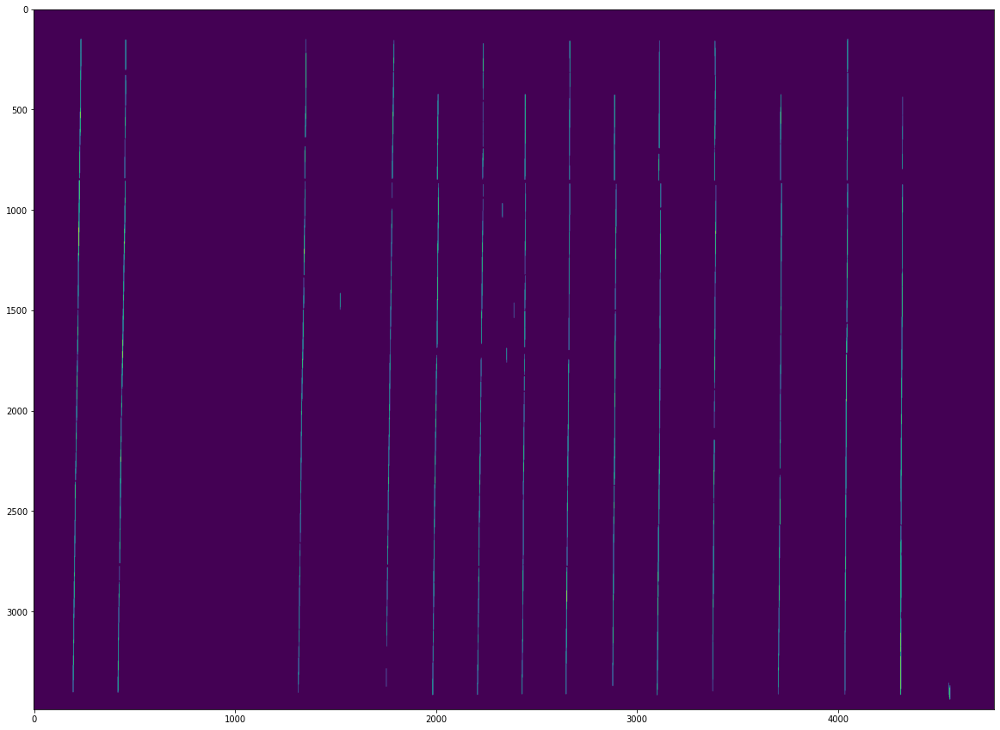

In [7]:
 # Identify the vertical line:
scale = 60
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, rows // scale))
eroded = cv2.erode(binary, kernel, iterations=1)
dilated_row = cv2.dilate(eroded, kernel, iterations=1)
show_image(dilated_row)

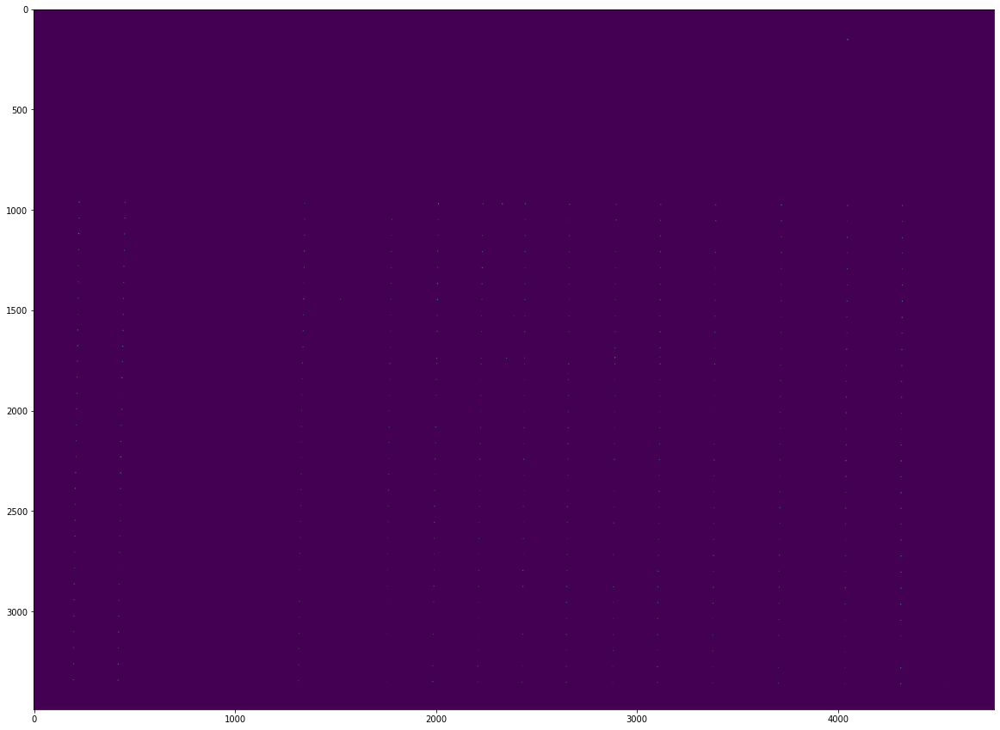

In [8]:
# Combine the identified horizontal and vertical lines
bitwise_and = cv2.bitwise_and(dilated_col, dilated_row)
show_image(bitwise_and)

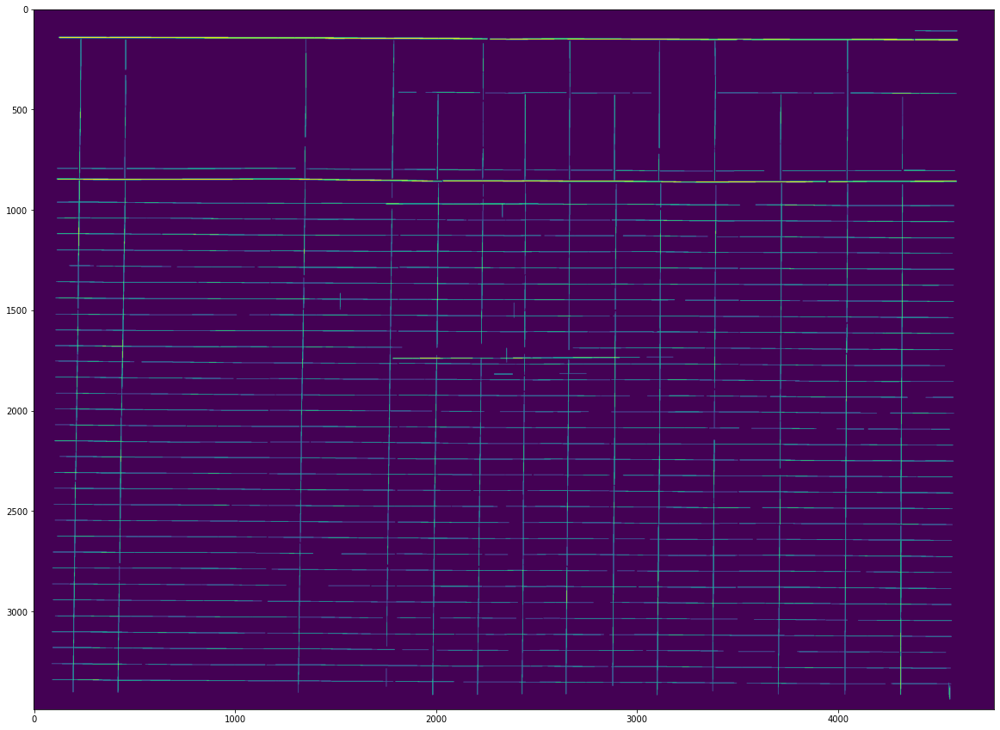

In [9]:
 # Identify table outline
merge = cv2.add(dilated_col, dilated_row)
show_image(merge)

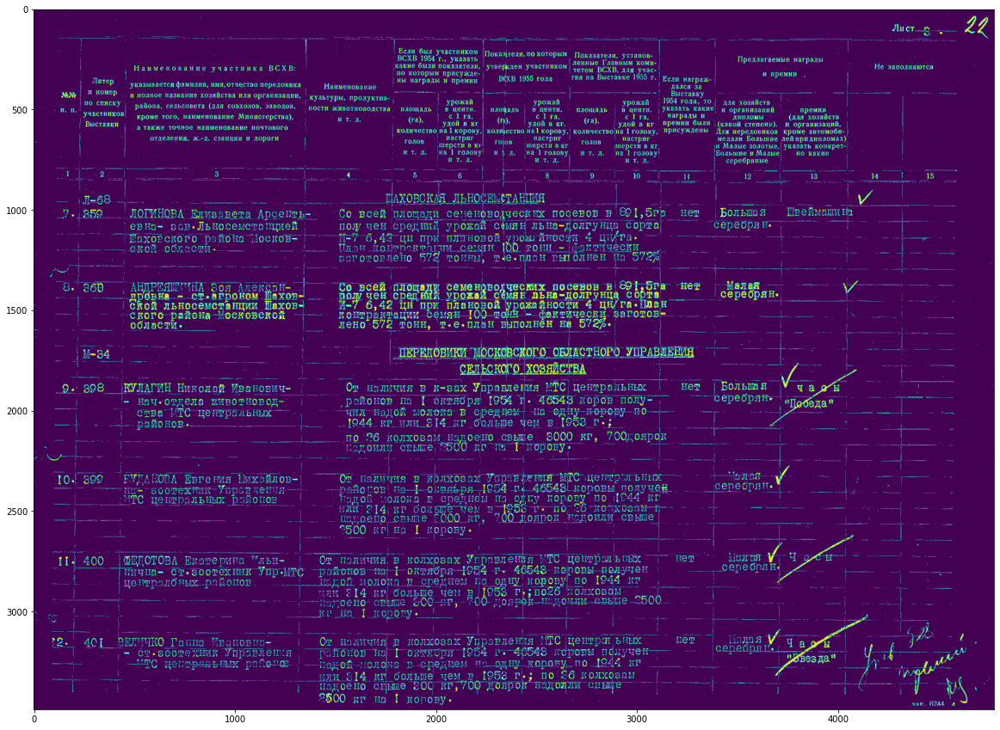

In [10]:
 # Two pictures are subtracted and the table borders are removed
merge2 = cv2.subtract(binary, merge)
show_image(merge2)

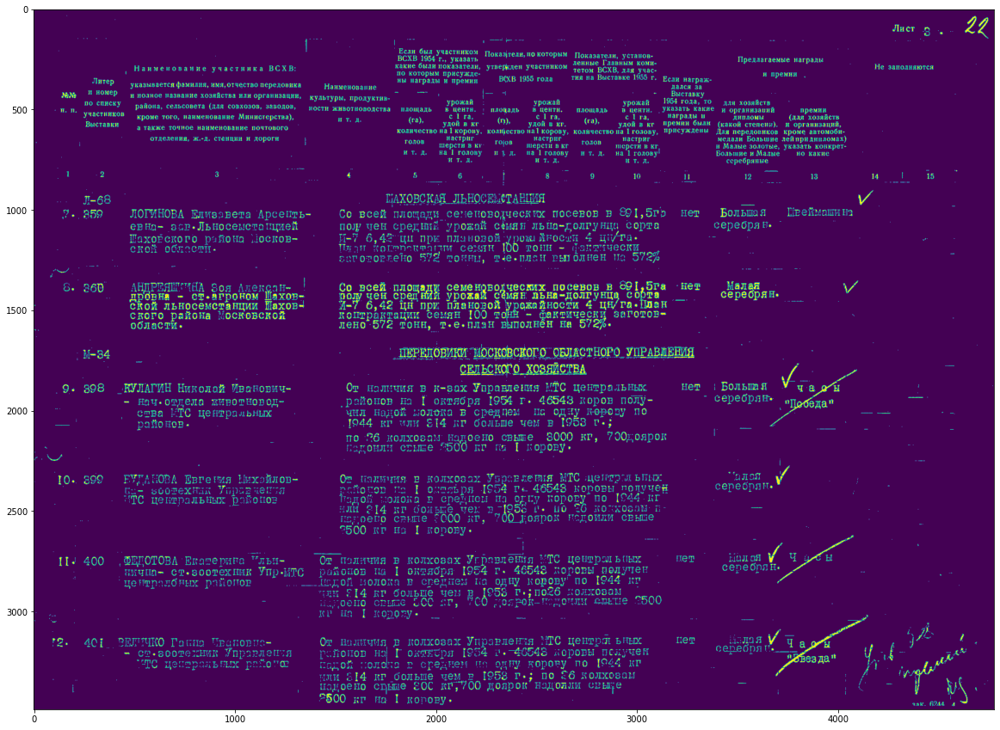

In [11]:
new_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
erode_image = cv2.morphologyEx(merge2, cv2.MORPH_OPEN, new_kernel)
show_image(erode_image)

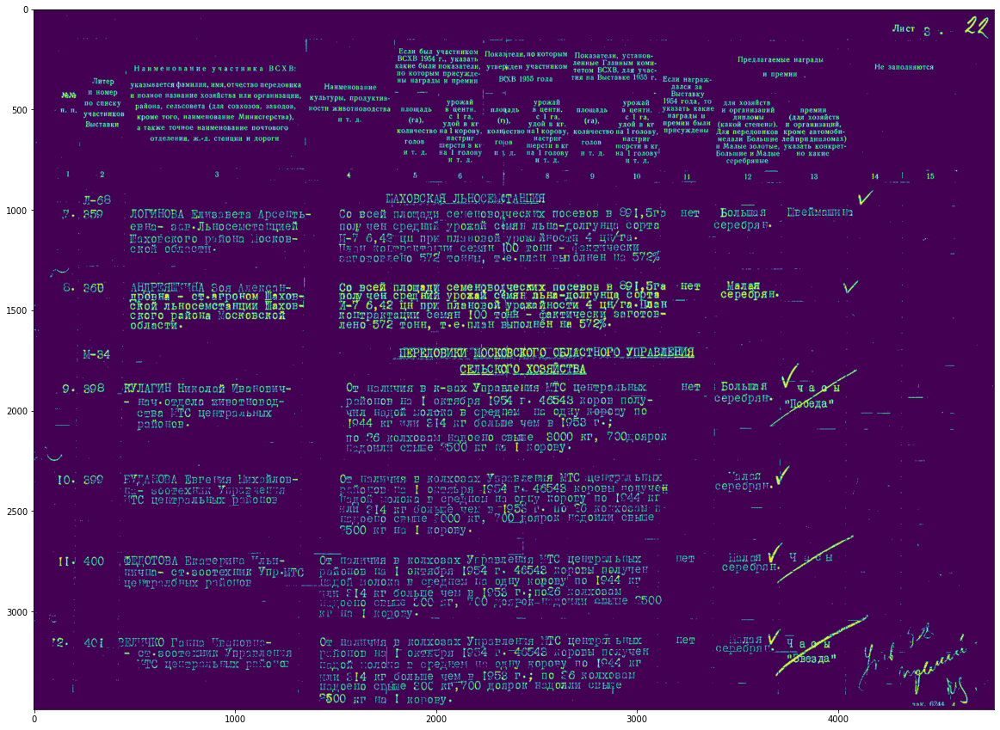

In [12]:
merge3 = cv2.add(erode_image, bitwise_and)
show_image(merge3)

In [13]:
 # Take out the focus logo
ys, xs = np.where(bitwise_and > 0)
print(ys, xs)

[ 151  151  152 ... 3359 3359 3359] [4050 4051 4050 ... 4315 4316 4553]


In [14]:
def find_text_boxes(pre, min_text_height_limit=50, max_text_height_limit=100):
    # Looking for the text spots contours
    # OpenCV 3
    # img, contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    # OpenCV 4
    contours, hierarchy = cv2.findContours(pre, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Getting the texts bounding boxes based on the text size assumptions
    boxes = []
    for contour in contours:
        box = cv2.boundingRect(contour)
        h = box[3]

        if min_text_height_limit < h < max_text_height_limit:
            boxes.append(box)

    return boxes

In [15]:
text_boxes = find_text_boxes(merge3)
print(text_boxes)

[(4555, 3362, 6, 51), (4385, 3361, 22, 52), (4384, 3284, 61, 75), (3726, 3202, 119, 77), (3834, 3123, 139, 77), (3777, 2723, 125, 76), (3894, 2644, 147, 78), (2331, 2467, 25, 88), (3758, 1935, 120, 74), (3875, 1856, 123, 76), (3750, 1776, 52, 76), (2551, 1771, 65, 51), (2122, 1771, 35, 53), (2445, 1770, 41, 53), (2785, 1531, 64, 67), (2353, 1531, 32, 62), (2328, 1461, 51, 68), (3019, 1385, 27, 64), (1157, 1376, 23, 68), (1926, 1373, 59, 74), (2320, 1372, 27, 76), (2233, 1372, 22, 74), (1988, 1372, 22, 75), (2350, 1154, 29, 56), (2384, 1153, 28, 57), (4104, 903, 75, 74), (1356, 151, 4, 54), (4634, 37, 58, 87)]


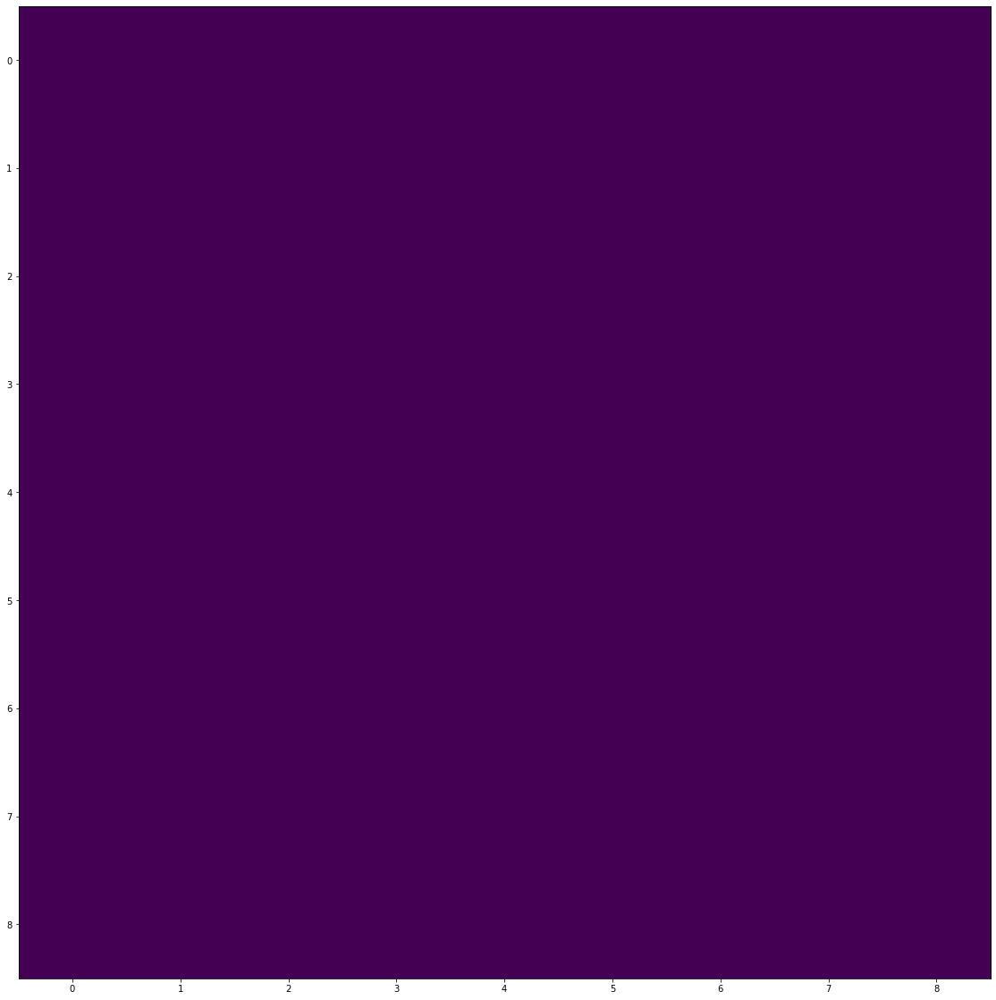

In [16]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(9,9))
show_image(kernel)

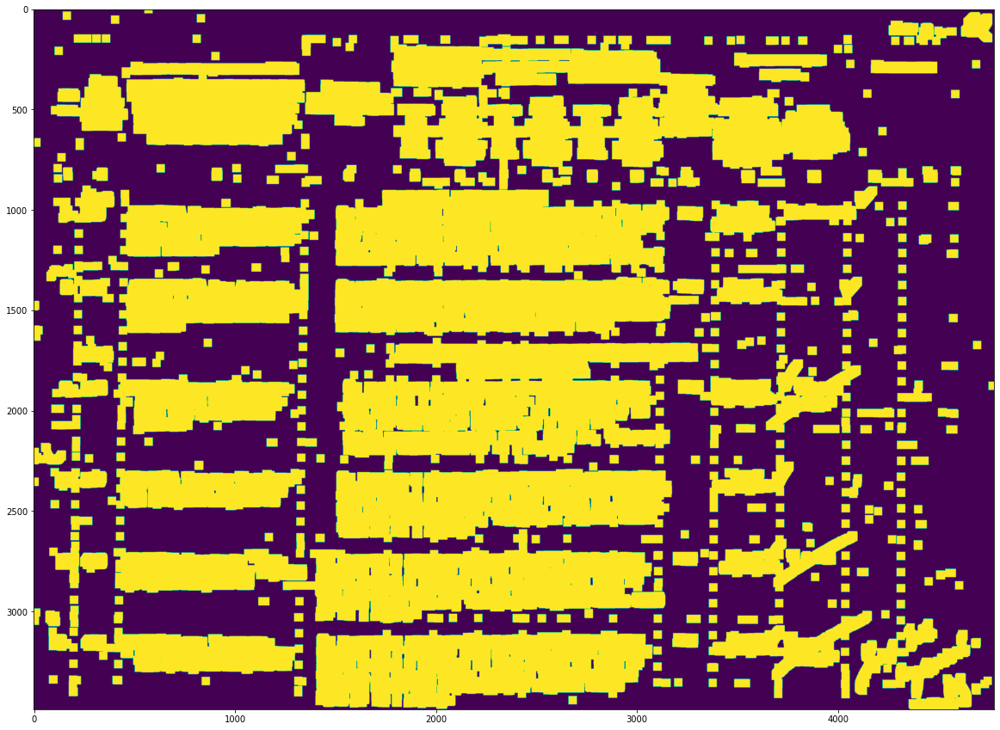

In [17]:
dilation = cv2.dilate(merge3,kernel,iterations = 5)
show_image(dilation)

[[1402, 3091, 1679, 394], [233, 3081, 1108, 231], [74, 3079, 146, 121], [4086, 3035, 582, 452], [3359, 2996, 813, 435], [231, 2706, 138, 101], [398, 2684, 965, 223], [78, 2652, 151, 232], [3408, 2600, 693, 300], [1240, 2590, 1904, 469], [1503, 2290, 1674, 368], [369, 2289, 983, 207], [84, 2286, 281, 123], [3364, 2221, 419, 284], [0, 2161, 162, 109], [398, 1815, 902, 303], [92, 1813, 279, 124], [3206, 1745, 911, 364], [1510, 1638, 1798, 655], [197, 1628, 203, 177], [3181, 1344, 156, 77], [3370, 1336, 480, 142], [3984, 1334, 139, 144], [1498, 1334, 1812, 313], [424, 1319, 945, 303], [64, 1258, 335, 204], [3341, 955, 350, 204], [430, 902, 969, 333], [1499, 900, 1665, 435], [3693, 883, 506, 197], [98, 880, 305, 186], [4152, 794, 227, 92], [1351, 353, 484, 233], [86, 326, 385, 283], [3610, 298, 250, 68], [438, 263, 913, 422], [4166, 255, 331, 68], [3486, 219, 462, 75], [1775, 128, 2289, 771], [4254, 60, 340, 121], [4614, 17, 157, 151]]
41


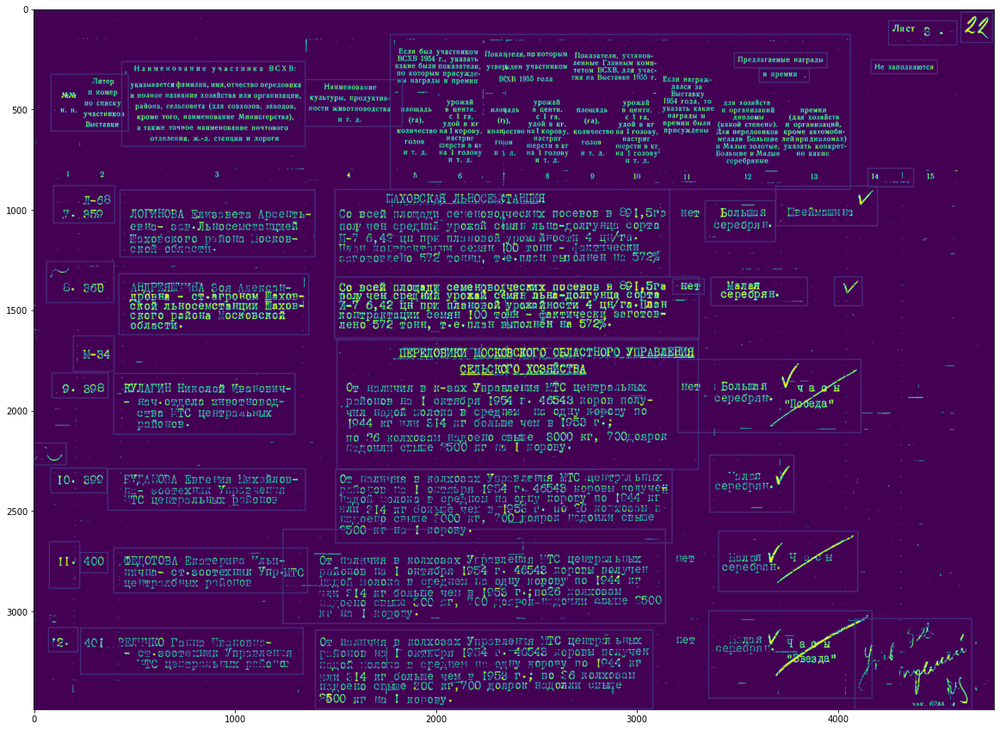

In [18]:
# Find contours, highlight text areas, and extract ROIs
cnts = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
ddd = merge3.copy()
ROI_number = 0
list_contur_num = []
list_contur_coord = []
k = -1
for c in cnts:
    area = cv2.contourArea(c)
    k += 1 
    if area > 10000:
        list_contur_num.append(k)
        x,y,w,h = cv2.boundingRect(c)
        list_contur_coord.append([x,y,w,h])
        cv2.rectangle(ddd, (x, y), (x + w, y + h), (36,255,12), 3)
        # ROI = image[y:y+h, x:x+w]
        # cv2.imwrite('ROI_{}.png'.format(ROI_number), ROI)
        # ROI_number += 1
print(list_contur_coord)
print(len(list_contur_coord))
show_image(ddd)

In [19]:
def def_text(out):
    d = pytesseract.image_to_data(out, output_type=pytesseract.Output.DICT, lang="rus")
    n_boxes = len(d['level'])
    print(n_boxes)
    img_rez = out.copy()
    #file_mistakes = open('file_mistakes2.txt','a')
    for i in range(n_boxes):
        (t, x, y, w, h) = (d['text'][i],d['left'][i], d['top'][i], d['width'][i], d['height'][i])    
        img_rez = cv2.rectangle(img_rez, (x, y), (x + w, y + h), (0, 255, 0), 1)
        t = t.strip().replace('|','').replace('.','').replace('--','').replace('—-','').replace('”','')
        if len(t)>1 and len(t)< 15 and not t.isdigit():
            print(t, x, y, w, h, sep=' | ')
            #file_mistakes.write(t+'\n'))

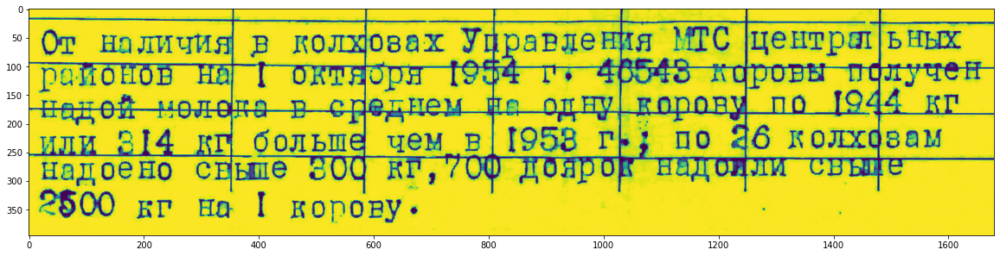

41
От | 23 | 36 | 59 | 45
на | 124 | 45 | 54 | 33
личи | 187 | 20 | 114 | 101
овах | 356 | 22 | 367 | 77
цеытрш | 811 | 23 | 656 | 79
БНЫХ` | 1494 | 13 | 154 | 105
ПИ | 62 | 226 | 11 | 28
больш | 392 | 181 | 415 | 78
колх | 1322 | 196 | 135 | 60
заы | 1467 | 210 | 122 | 34
Надоено | 23 | 266 | 226 | 44
сныпе | 292 | 265 | 157 | 34
с00 | 488 | 262 | 95 | 37
кг, | 624 | 265 | 84 | 42
(ОФ | 765 | 261 | 52 | 31
Ддеярок | 867 | 260 | 178 | 32
ВЫШ | 1399 | 262 | 78 | 26
кг | 188 | 333 | 61 | 33
на | 296 | 332 | 60 | 33
когову | 456 | 332 | 221 | 41


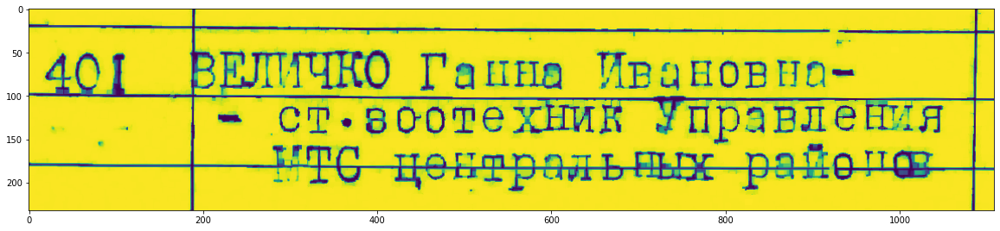

19
ГЧКО | 292 | 48 | 123 | 45
Гасна | 450 | 51 | 162 | 43
Ивановна- | 653 | 36 | 295 | 58
ст-воотех | 288 | 112 | 301 | 32
`ч | 458 | 189 | 20 | 8


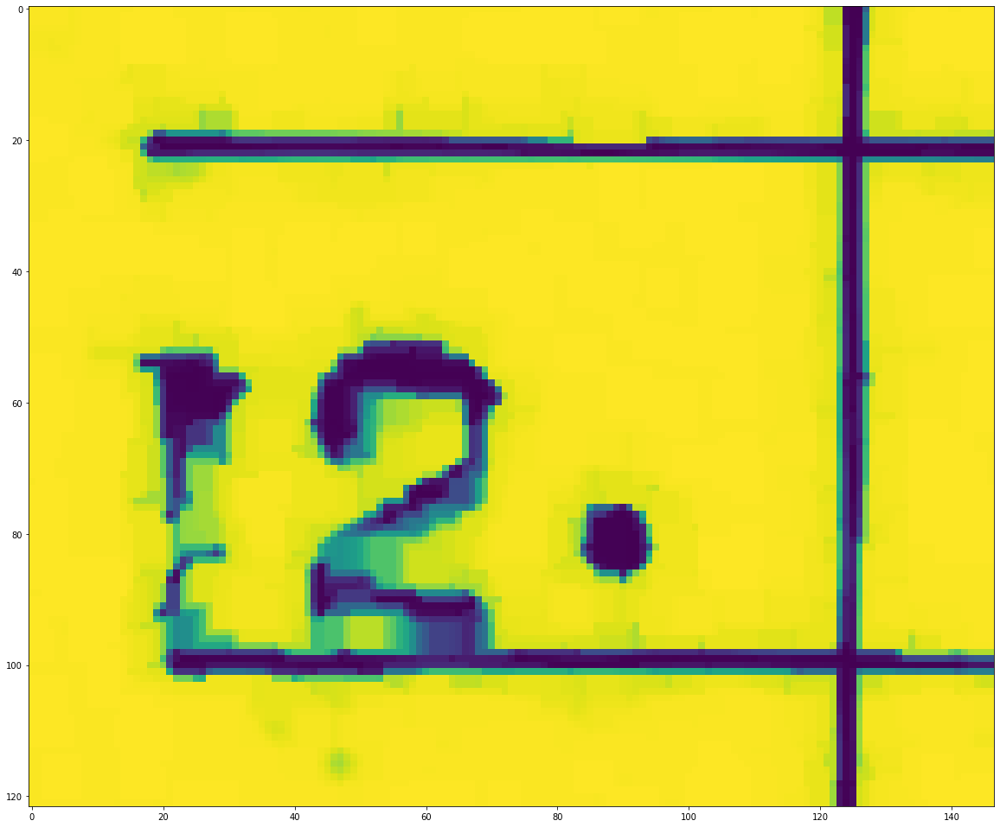

1


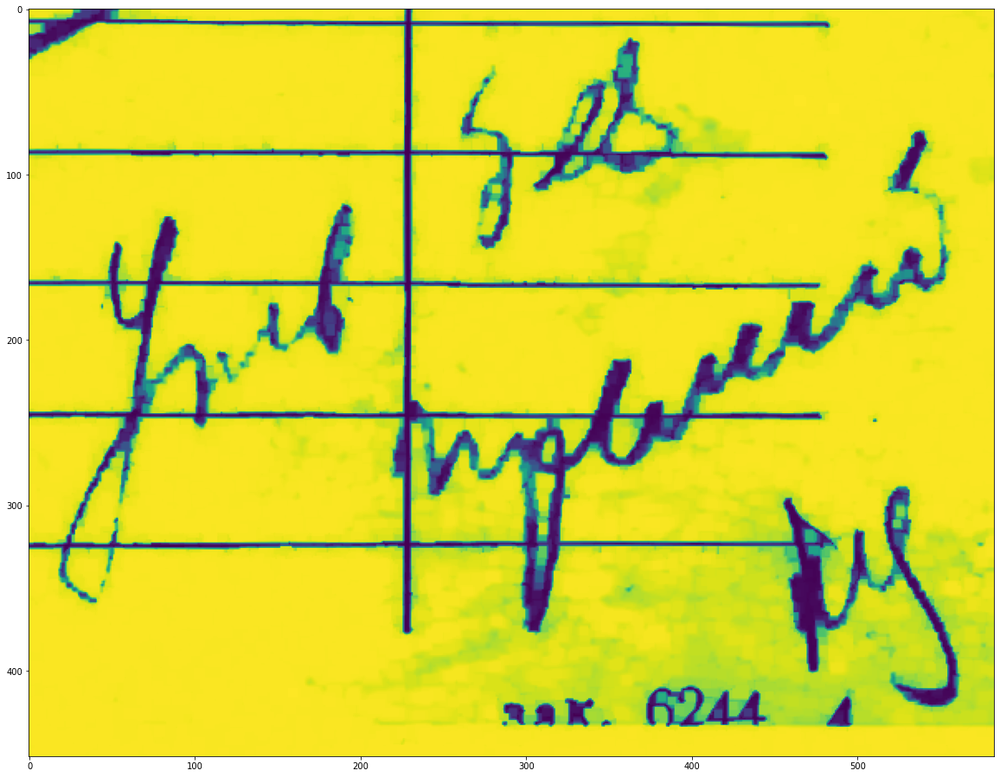

5


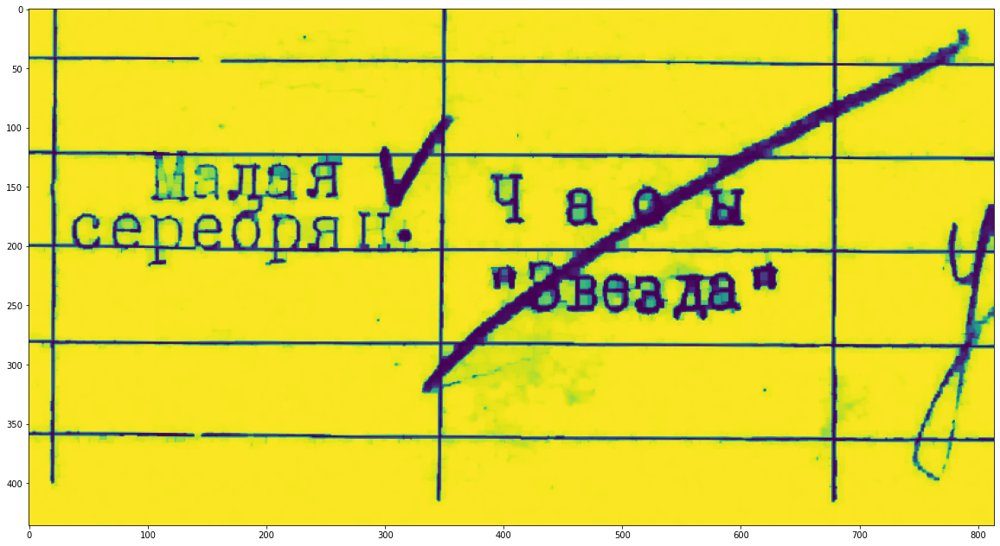

5


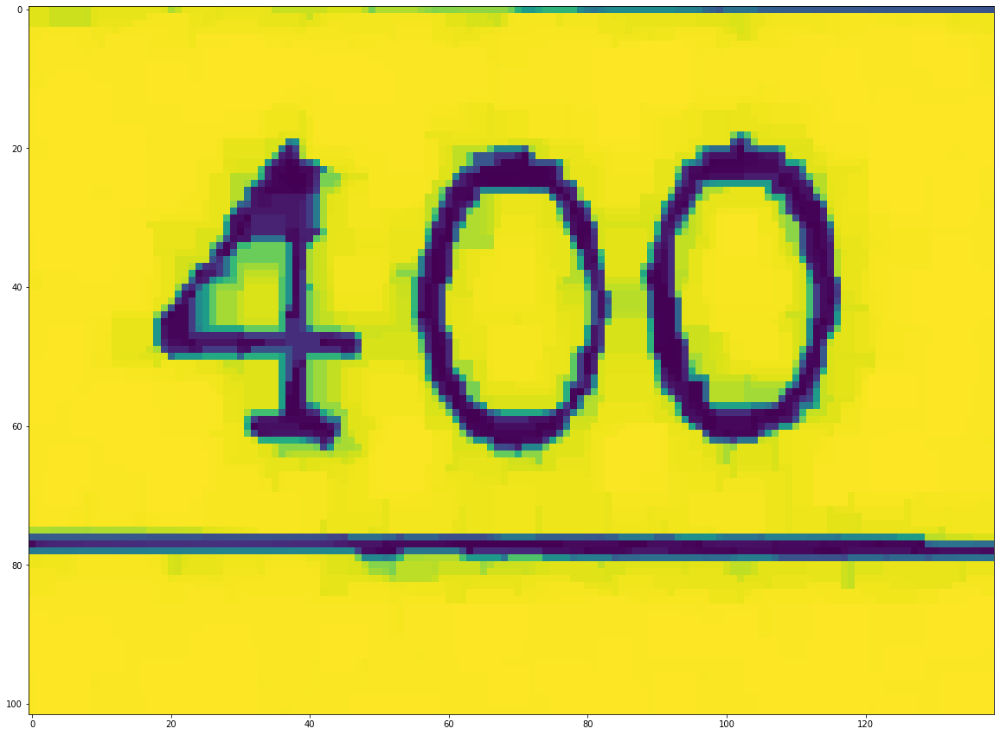

5


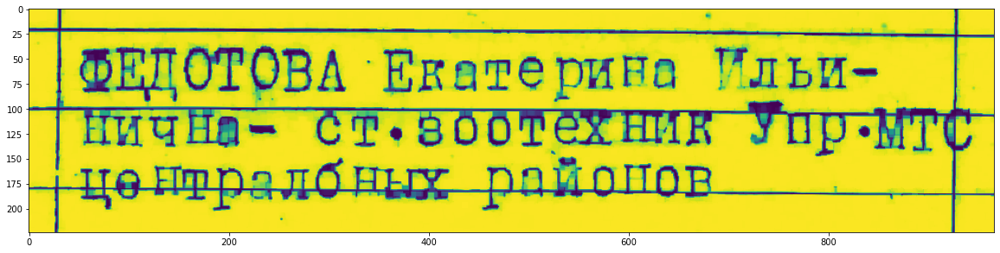

22
ФЕДОТОВА | 51 | 37 | 291 | 56
Екате | 355 | 40 | 158 | 44
ри | 526 | 49 | 60 | 44
ПЦ | 595 | 47 | 52 | 33
-“л | 678 | 6 | 72 | 75
Ьи— | 760 | 49 | 90 | 31


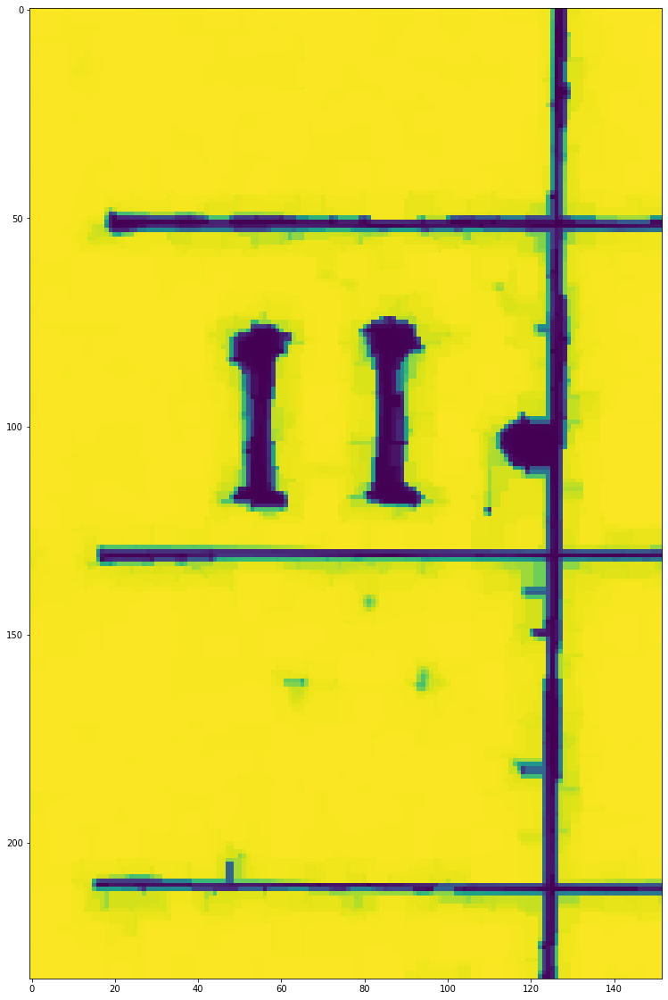

1


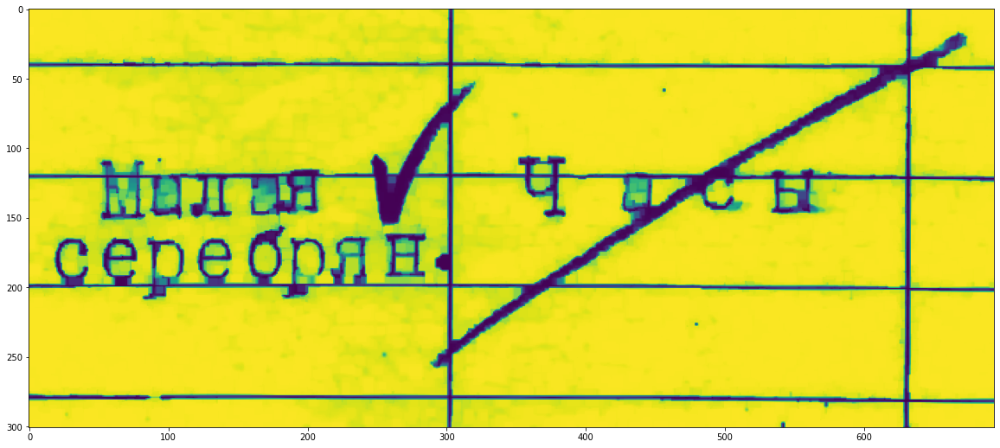

10
серебря | 0 | 156 | 286 | 53


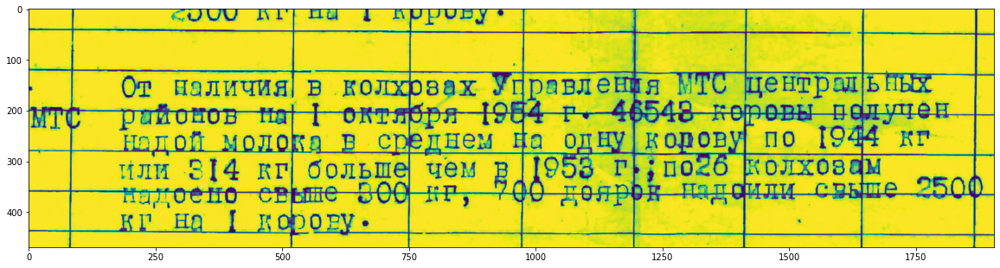

22
сельце | 521 | 253 | 890 | 137
чем | 760 | 249 | 122 | 146
До58 | 979 | 249 | 122 | 146
РЕ | 1125 | 249 | 110 | 146
0е° | 1234 | 249 | 111 | 146


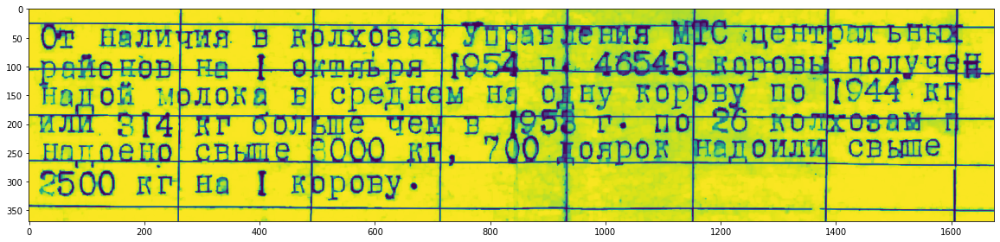

34
"590 | 20 | 280 | 130 | 46
вг | 187 | 223 | 85 | 146
на | 271 | 223 | 74 | 146
пррову | 441 | 264 | 273 | 82


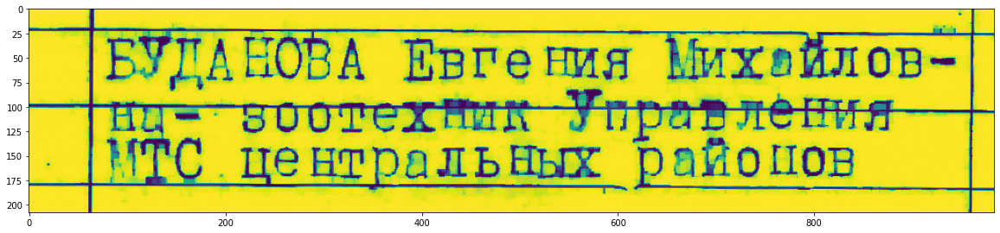

5


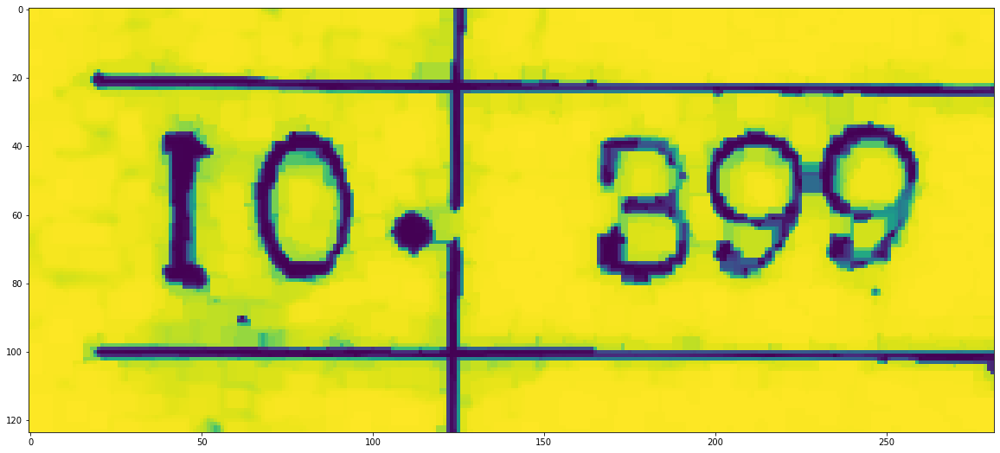

1


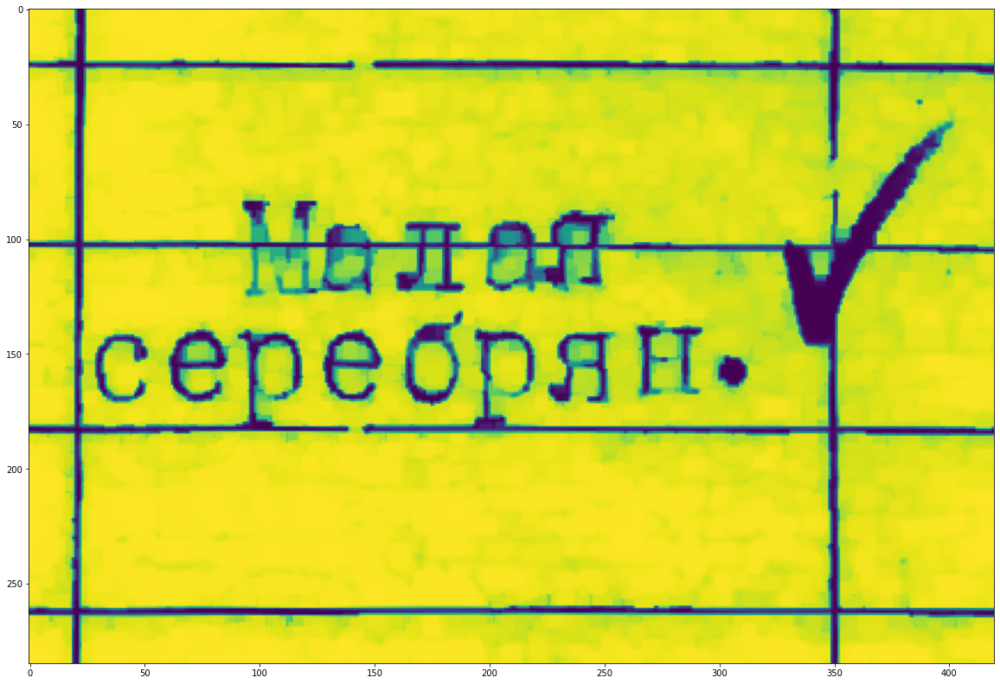

17
АН | 108 | 96 | 72 | 28
ее | 201 | 95 | 43 | 25
сересрян» | 29 | 132 | 284 | 41


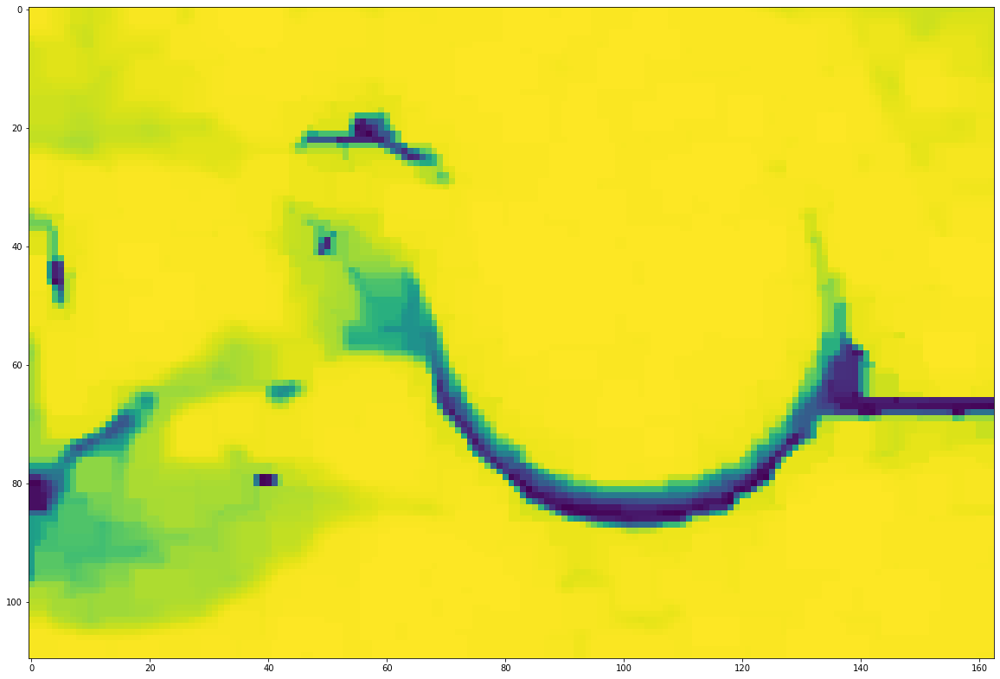

1


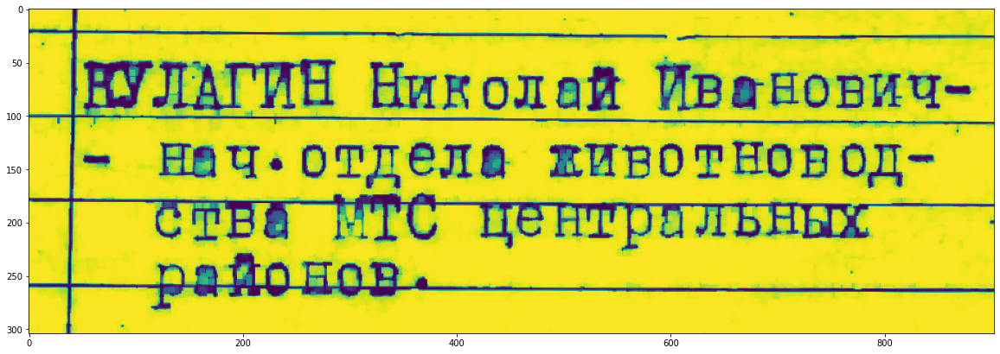

19
ВНУЛАГИН | 51 | 47 | 236 | 53
Николай | 319 | 50 | 235 | 46
Иванович- | 586 | 45 | 296 | 51
начотдела | 122 | 125 | 324 | 43
ЖхивотНовод- | 487 | 113 | 383 | 55


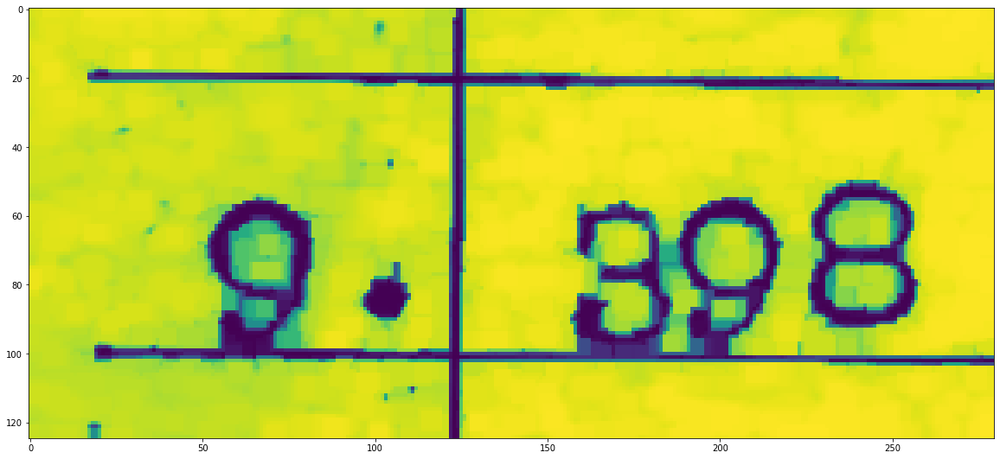

1


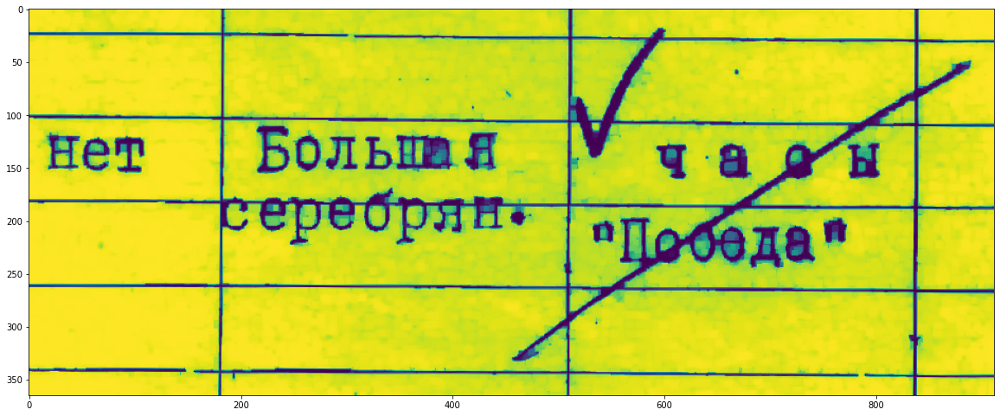

9


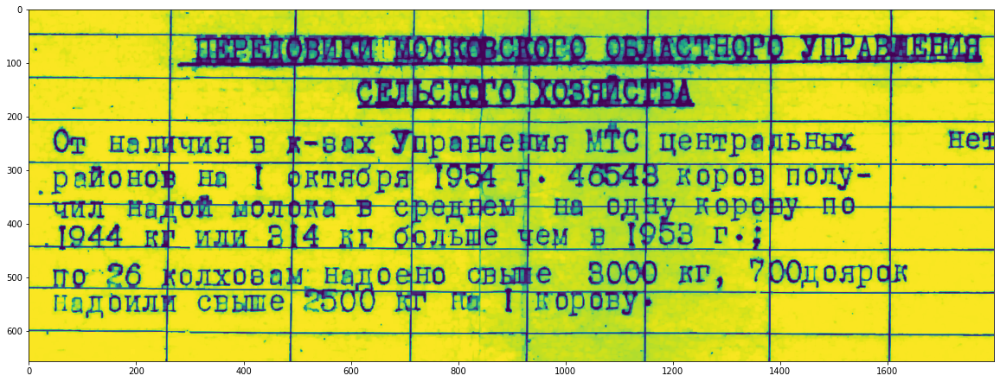

63
ТЕРЕДОВИКИ | 319 | 49 | 380 | 50
нОСКОВСКОГо | 710 | 51 | 319 | 48
ОБЛАСТНОРО | 1081 | 52 | 320 | 43
УПРАВЖЕНИЯ | 1415 | 51 | 350 | 59
_—___ | 498 | 101 | 884 | 58
'-н- | 253 | 207 | 753 | 157
РС | 1086 | 211 | 37 | 55
центрц | 1176 | 210 | 429 | 158
нет | 1713 | 224 | 86 | 38
СА | 783 | 289 | 77 | 26
ААН | 1085 | 290 | 83 | 34
аа | 19 | 291 | 251 | 94
каевий | 289 | 299 | 144 | 85
ои | 933 | 287 | 605 | 94
или | 325 | 415 | 68 | 27
ШШ_ | 715 | 368 | 889 | 79
то | 52 | 489 | 49 | 29
олеова | 282 | 483 | 190 | 32
нро | 552 | 480 | 123 | 80
шшш | 688 | 447 | 917 | 156
пад | 48 | 532 | 91 | 44
силу | 179 | 515 | 90 | 49
свы:шеЁ | 315 | 525 | 270 | 77
'і' | 931 | 528 | 216 | 75
ои | 1383 | 528 | 221 | 77


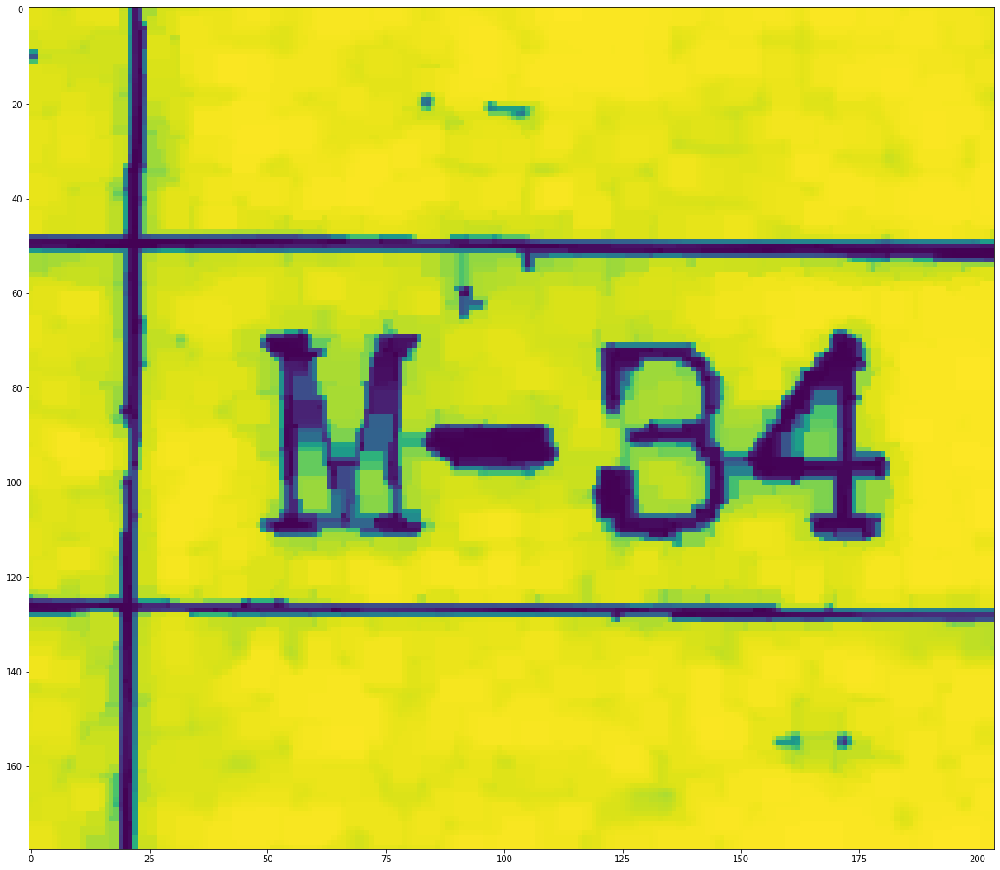

1


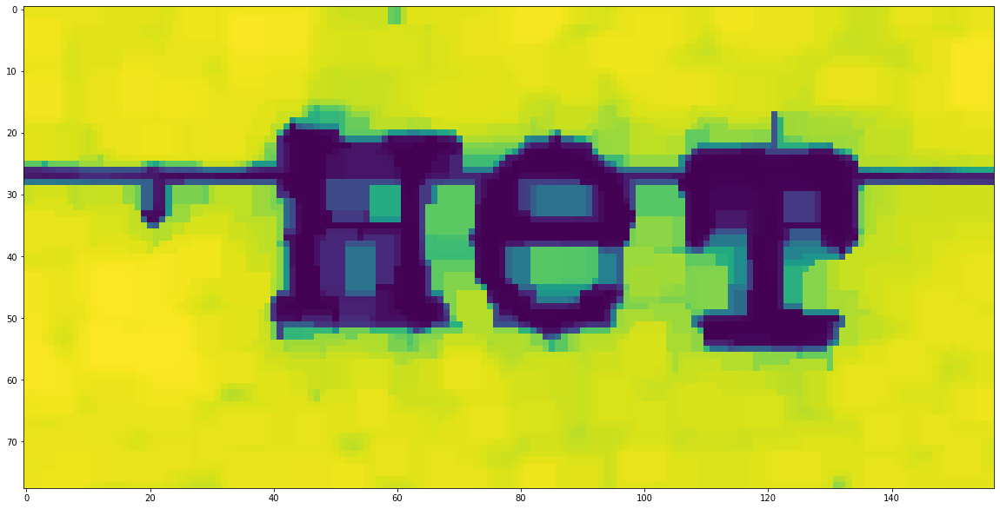

1


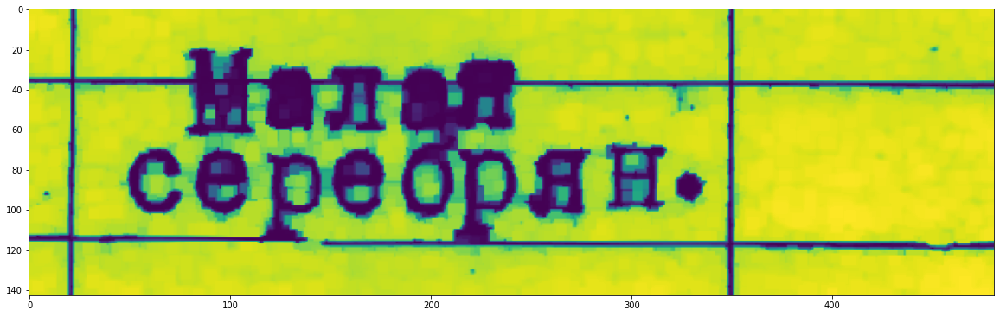

6
ое | 128 | 69 | 47 | 35
1-!Ш | 192 | 38 | 157 | 78


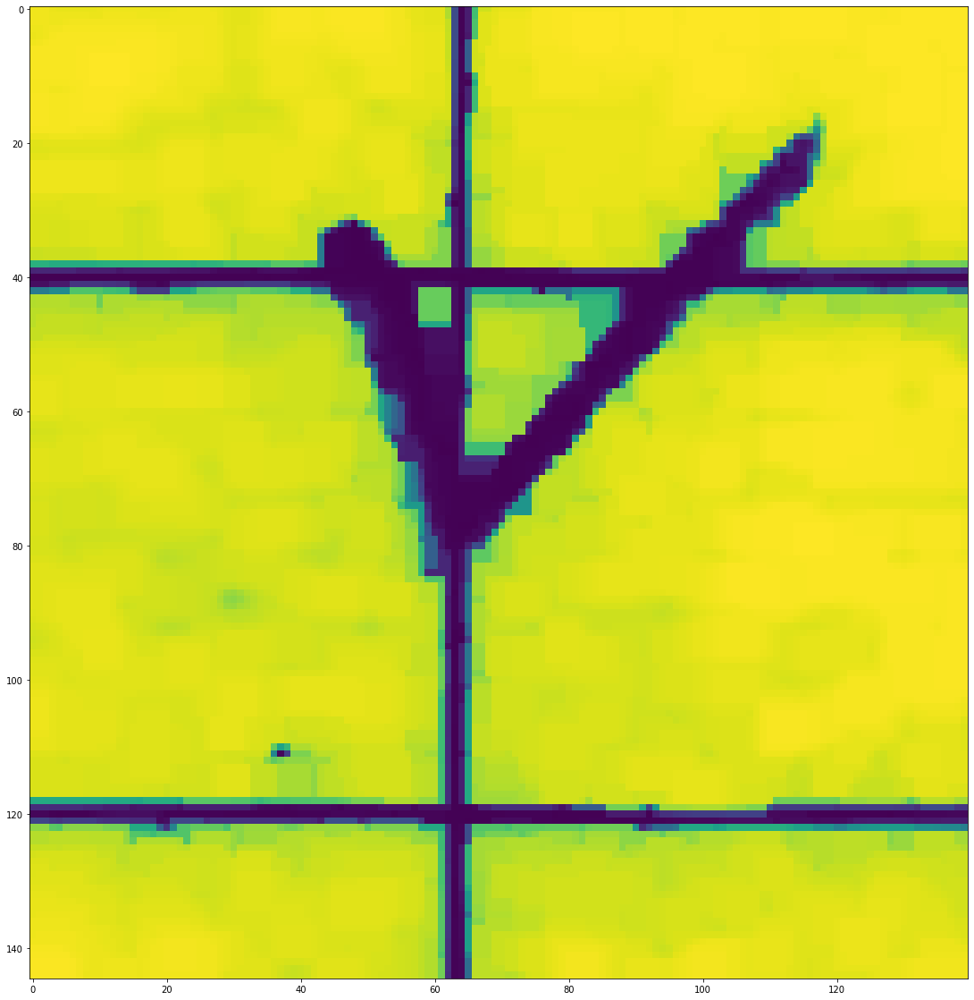

1


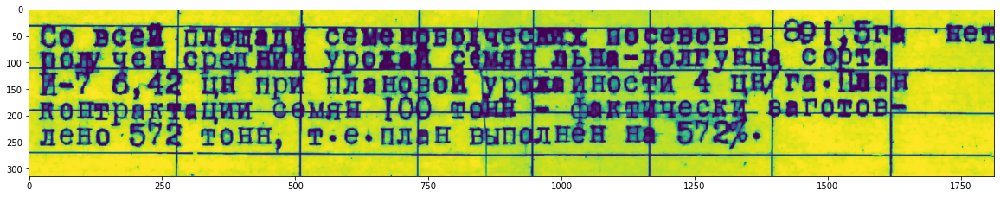

5


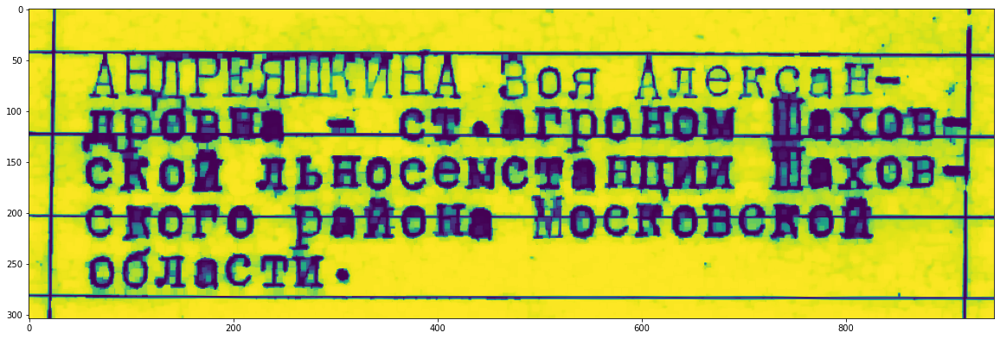

5


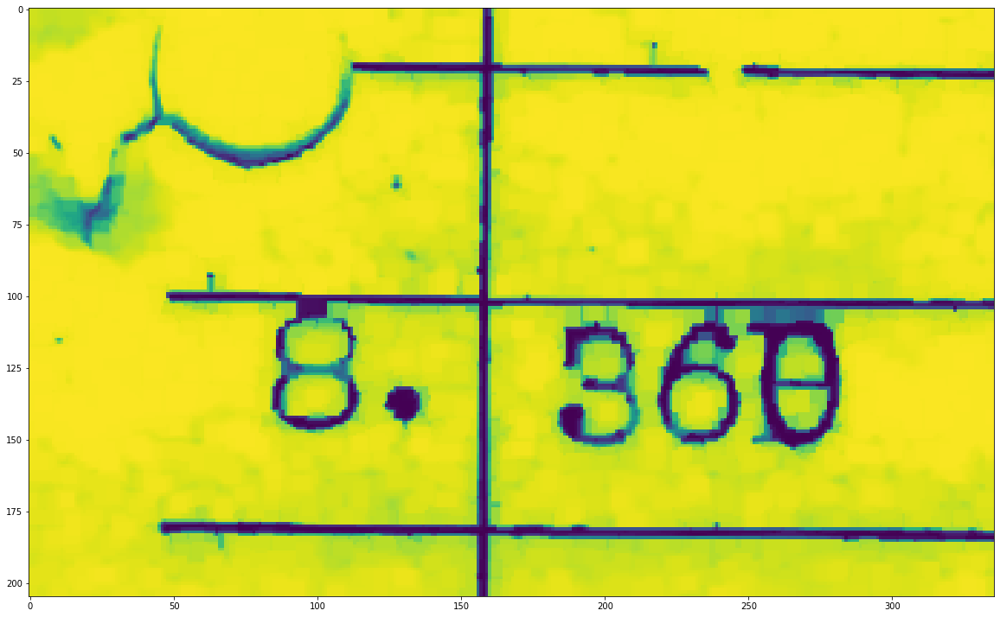

1


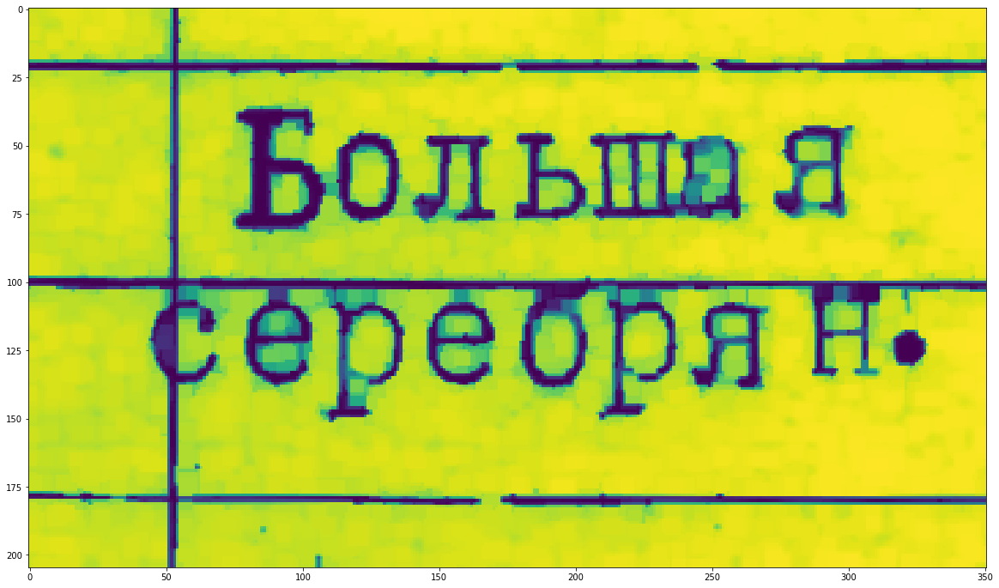

12
Больша | 76 | 37 | 185 | 46


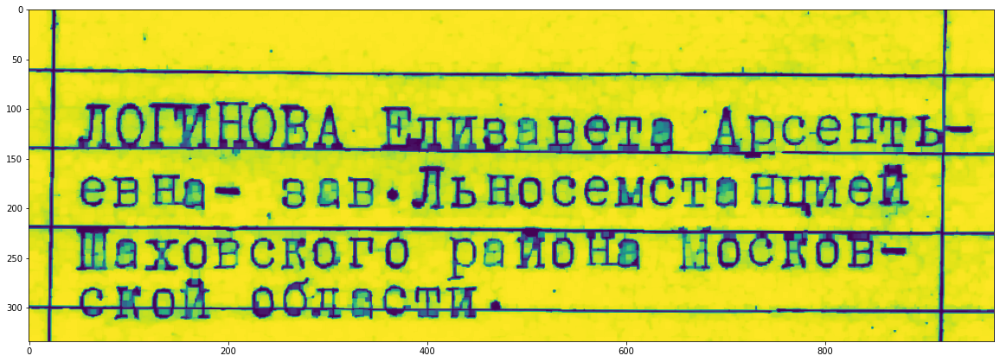

5


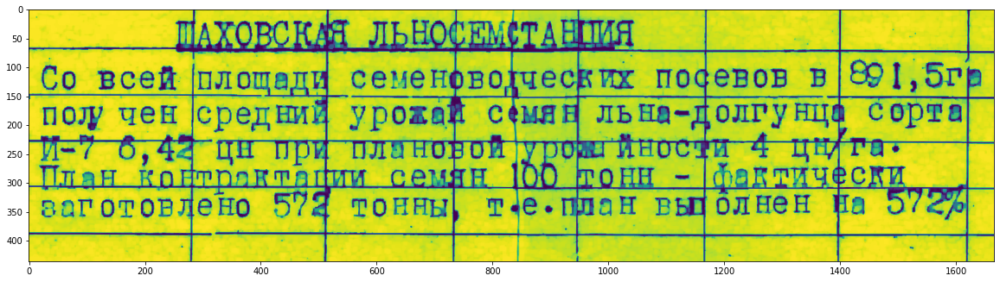

57
"{‚;:і | 262 | 26 | 169 | 43
\{" | 466 | 26 | 75 | 43
ЛЬНО | 596 | 27 | 121 | 41
‚"' | 892 | 23 | 93 | 44
Со_всей | 23 | 97 | 232 | 44
[площад | 292 | 108 | 187 | 41
сеченевов | 558 | 73 | 818 | 79
1, | 1475 | 83 | 69 | 75
5гв | 1544 | 87 | 97 | 57
полу | 25 | 168 | 103 | 42
чен | 156 | 167 | 100 | 34
средшт | 291 | 166 | 201 | 47
урожа | 554 | 167 | 163 | 45
пщ | 737 | 153 | 209 | 76
льНа- | 981 | 149 | 158 | 67
олгу | 1157 | 163 | 224 | 44
сорта | 1450 | 162 | 161 | 34
Тпан | 28 | 275 | 46 | 30
ХЛ | 130 | 235 | 172 | 71
1= | 330 | 230 | 148 | 76
'ЁШНМЁЧ'Ш | 515 | 229 | 882 | 80
Фалтически | 1169 | 231 | 450 | 78
заготовлено | 23 | 326 | 359 | 35
тонны) | 526 | 305 | 226 | 87
т«е+план | 790 | 323 | 259 | 59
ВЫ | 1081 | 326 | 54 | 31


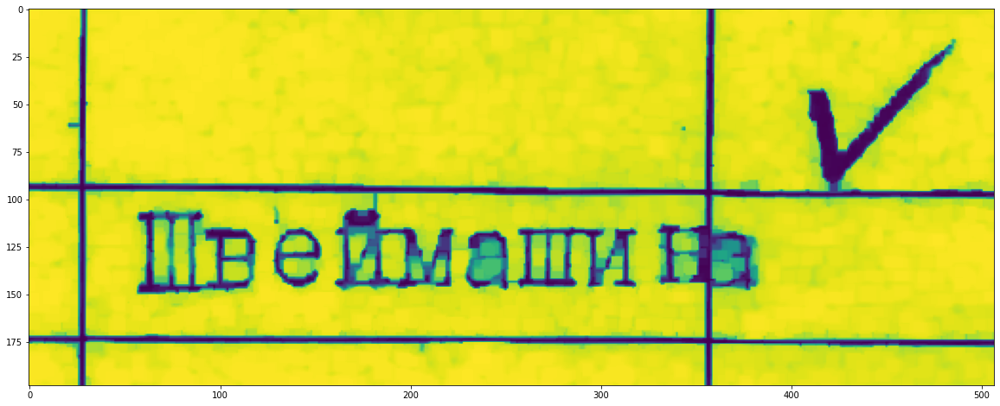

1


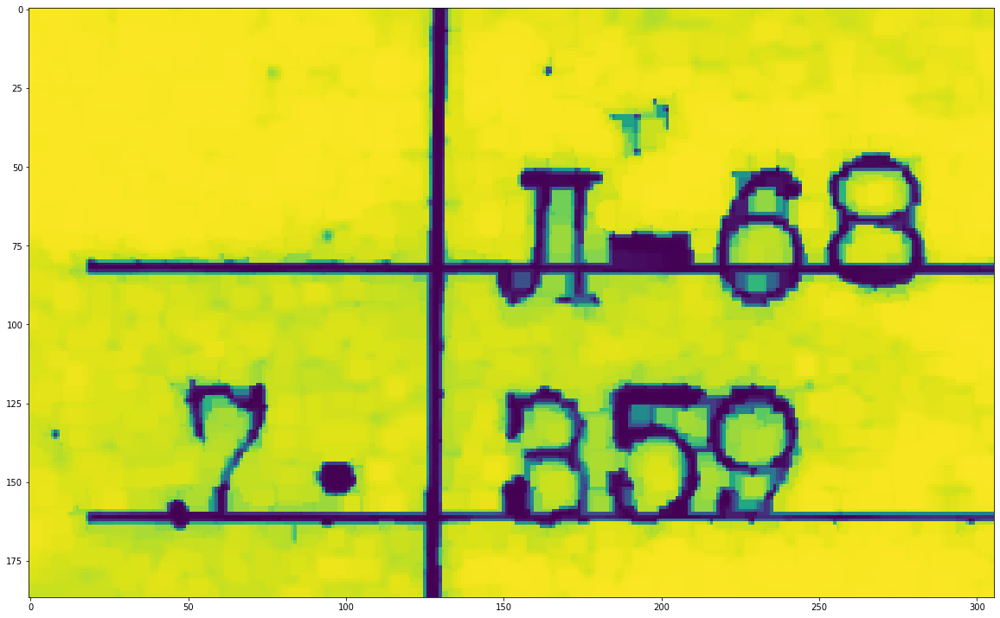

1


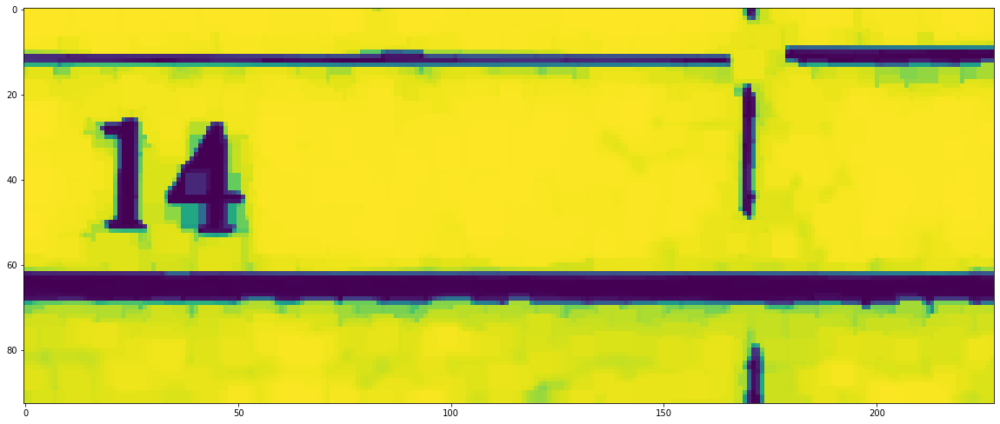

5


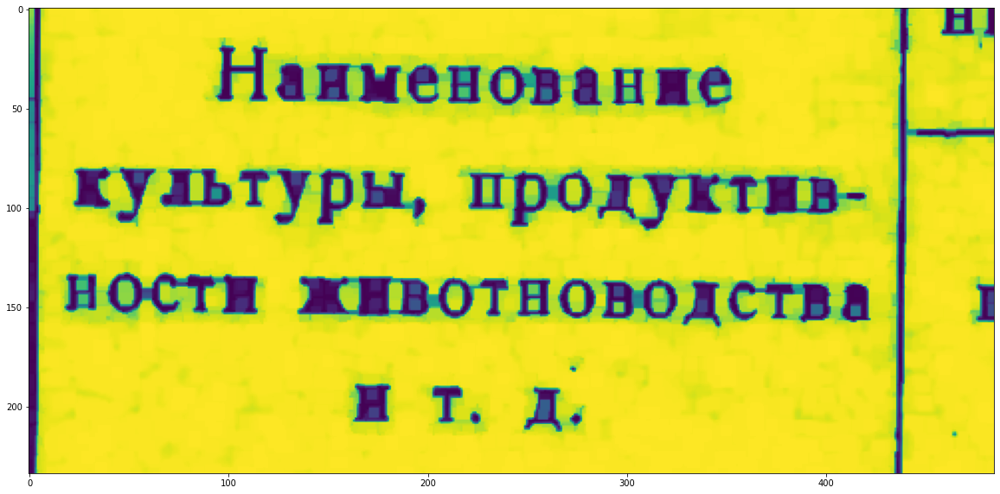

20
Н! | 459 | 0 | 26 | 14
Наименование | 94 | 19 | 259 | 31
культуры, | 23 | 80 | 177 | 29
продуктив- | 221 | 82 | 200 | 30
ности | 18 | 133 | 97 | 21
животноводства | 135 | 135 | 288 | 25


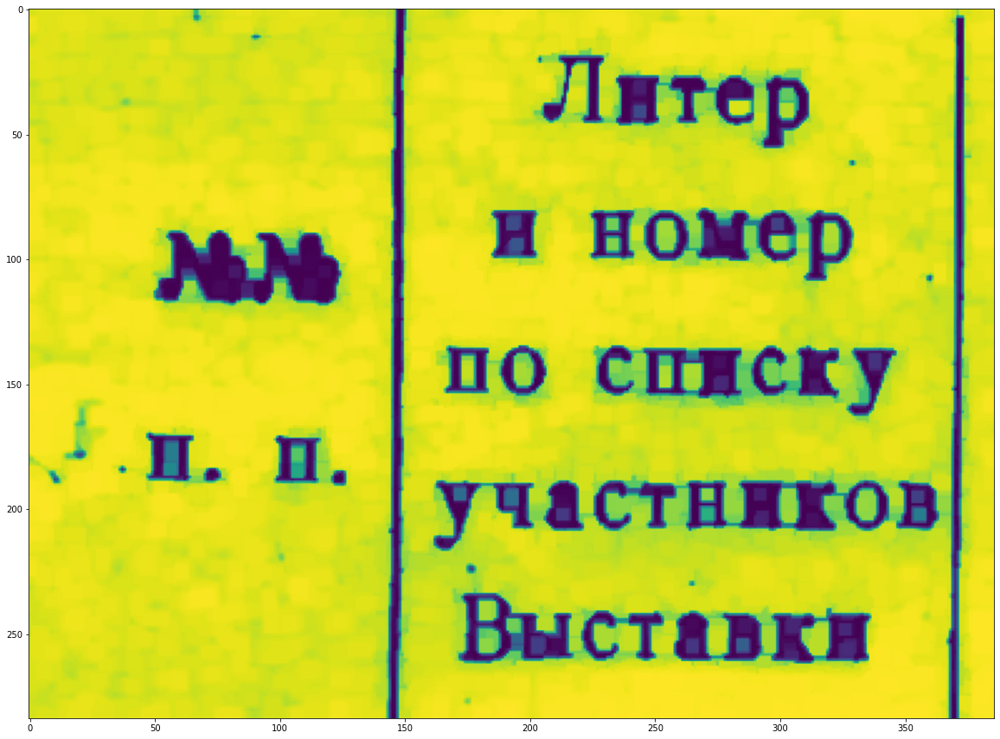

25
Литер | 206 | 19 | 106 | 37
№№ | 50 | 77 | 77 | 46
номер | 225 | 80 | 105 | 29
по | 167 | 135 | 40 | 20
списку | 227 | 135 | 120 | 28
‚н | 9 | 170 | 68 | 20
участников | 162 | 189 | 202 | 28
Выставки | 172 | 234 | 165 | 28


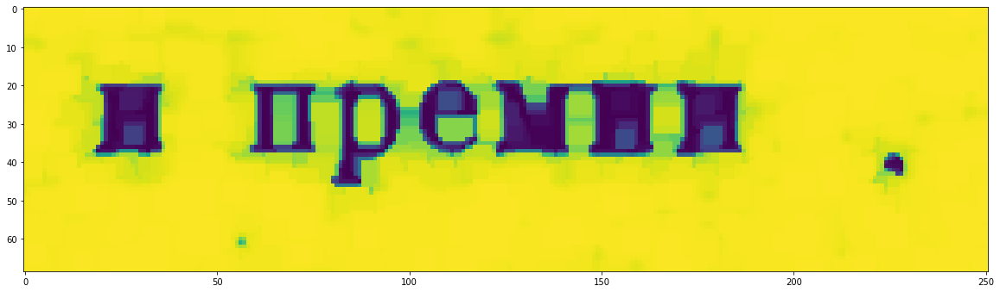

6
премии | 59 | 19 | 128 | 28


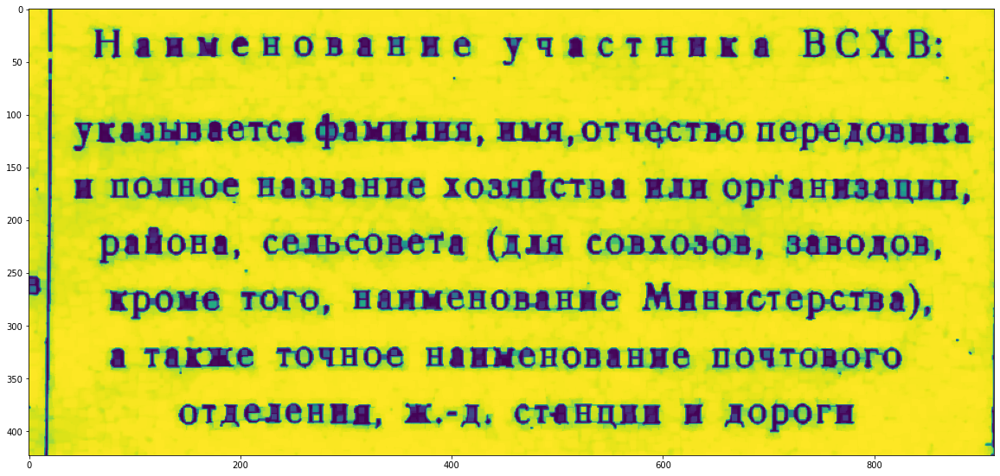

46
Наименование | 62 | 20 | 356 | 27
участника | 449 | 27 | 253 | 27
ВСХВ: | 733 | 19 | 131 | 28
указывается | 42 | 105 | 219 | 30
фамилия, | 272 | 99 | 159 | 35
ныя, | 428 | 95 | 88 | 45
отчество | 524 | 95 | 156 | 45
передовика | 690 | 107 | 202 | 28
полное | 77 | 159 | 122 | 21
название | 216 | 160 | 159 | 20
хозяйства | 392 | 153 | 174 | 27
или | 584 | 161 | 59 | 19
организации, | 657 | 157 | 234 | 32
района, | 67 | 207 | 133 | 35
сельсовета | 222 | 211 | 191 | 23
(для | 434 | 206 | 72 | 34
совхозов, | 529 | 213 | 166 | 24
заводов, | 717 | 214 | 147 | 24
кроме | 58 | 256 | 123 | 44
того, | 201 | 247 | 84 | 43
наименование | 307 | 266 | 254 | 21
Мивистерства), | 581 | 259 | 273 | 36
также | 109 | 321 | 104 | 25
точное | 234 | 320 | 121 | 20
наименование | 376 | 320 | 250 | 21
почтового | 647 | 321 | 180 | 25
отделения, | 142 | 374 | 192 | 24
ж-д | 356 | 374 | 82 | 23
станции | 460 | 374 | 138 | 24
дороги | 659 | 374 | 123 | 27


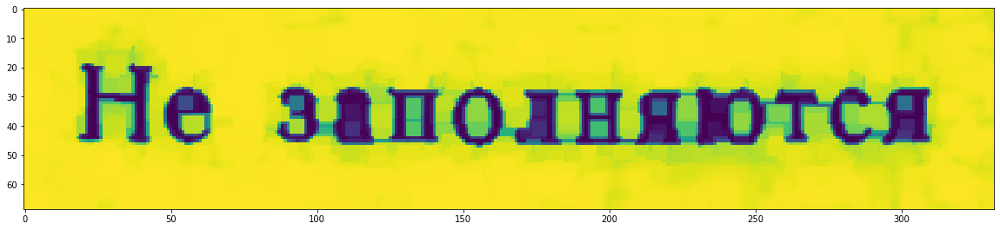

6
Не | 19 | 19 | 45 | 28
заполняются | 87 | 27 | 223 | 21


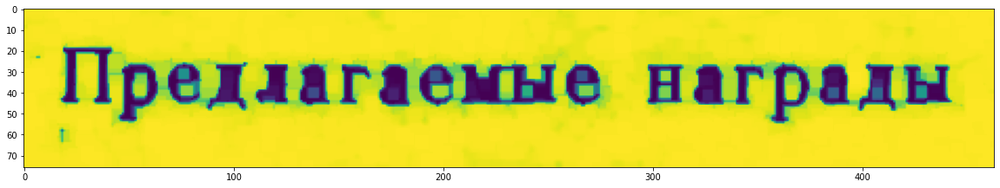

6
Предлагаемые | 18 | 19 | 257 | 35
награды | 298 | 26 | 144 | 29


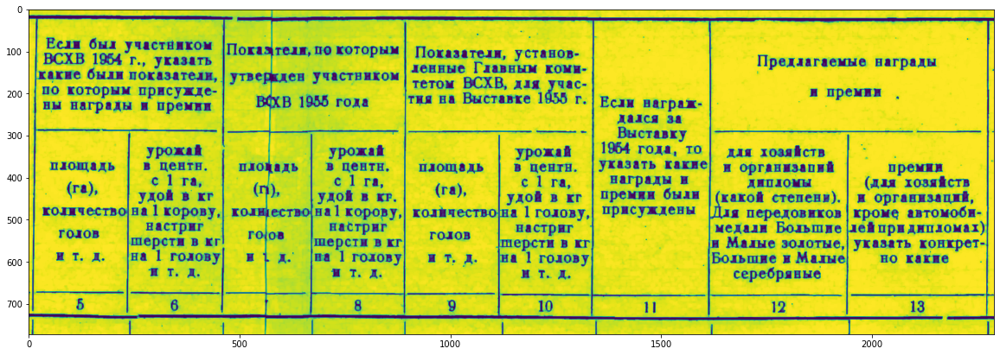

254
Если | 42 | 69 | 80 | 27
был | 144 | 69 | 63 | 27
участником | 228 | 75 | 207 | 31
ВСХВ | 36 | 104 | 96 | 28
г, | 241 | 114 | 35 | 24
указать | 299 | 114 | 135 | 28
какие | 24 | 148 | 99 | 27
были | 140 | 140 | 85 | 28
показатели, | 239 | 149 | 208 | 26
Показтели, | 471 | 83 | 198 | 27
по | 679 | 89 | 39 | 21
которым | 730 | 89 | 148 | 27
Показатели, | 918 | 89 | 213 | 33
установ- | 1153 | 97 | 152 | 27
ленные | 909 | 133 | 126 | 20
Главным | 1057 | 126 | 149 | 27
коми- | 1226 | 133 | 97 | 21
утверкден | 478 | 152 | 176 | 28
участвиком | 674 | 151 | 205 | 27
тетом | 911 | 169 | 98 | 21
ВСХВ, | 1031 | 161 | 103 | 32
лля | 1151 | 170 | 60 | 21
час- | 1255 | 170 | 68 | 20
по | 32 | 184 | 40 | 20
которым | 92 | 184 | 150 | 28
присужде- | 262 | 185 | 184 | 29
тия | 901 | 206 | 55 | 24
на | 974 | 206 | 37 | 19
Выставке | 1031 | 199 | 159 | 26
19'-55 | 1209 | 170 | 68 | 56
ны | 35 | 221 | 42 | 18
награды | 100 | 217 | 145 | 32
премии | 305 | 222 | 128 | 28
года | 730 | 213 | 76 | 23
ос | 

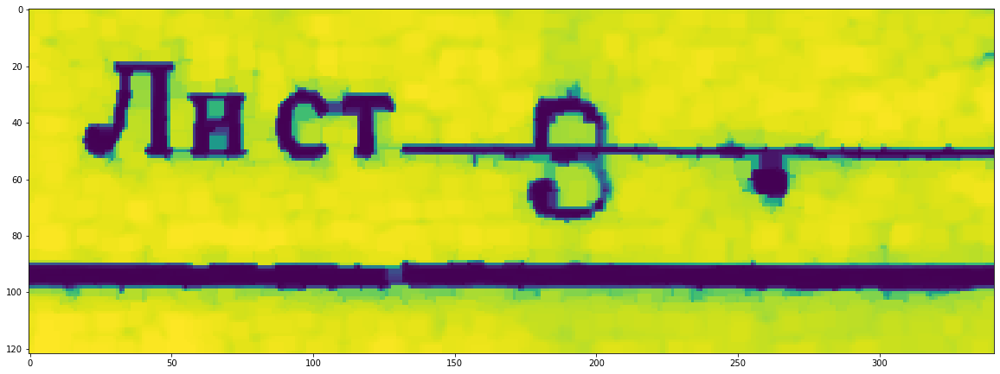

10
Лист__в | 19 | 19 | 186 | 34


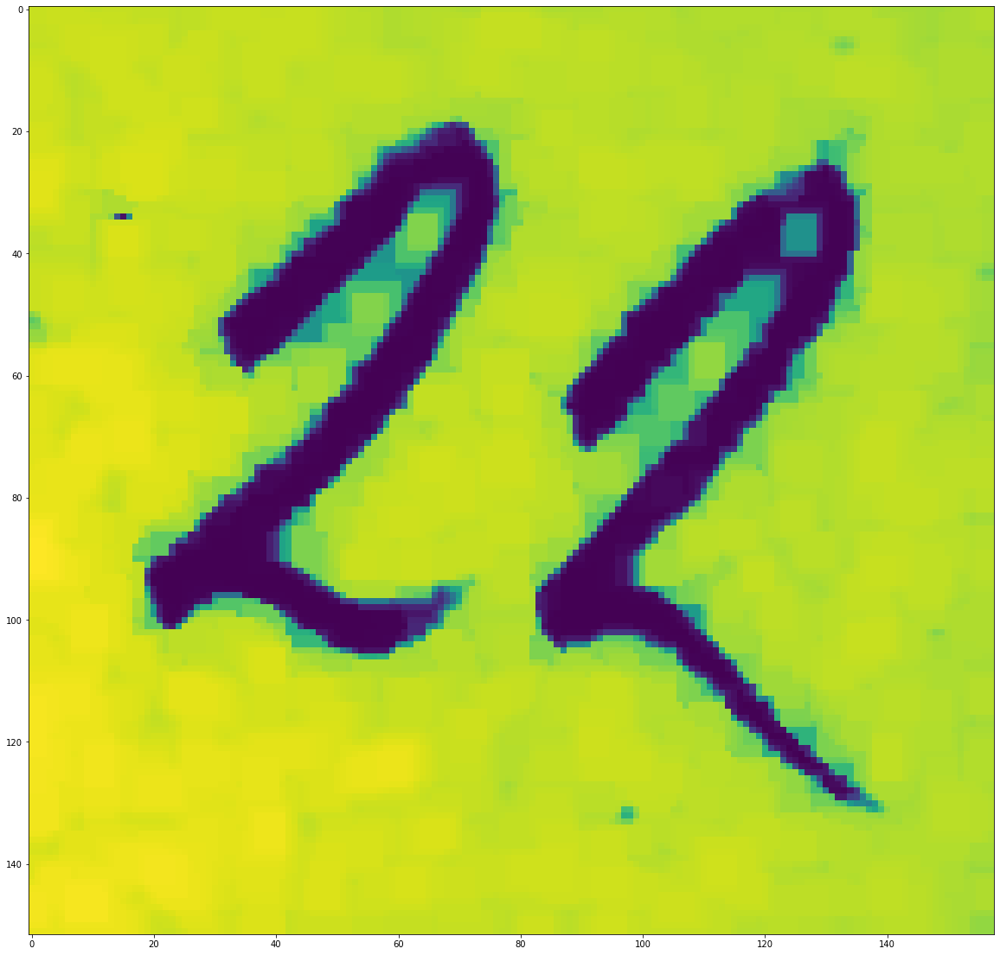

1


In [27]:
mask = np.zeros_like(gray)
ish_img = cv2.imread(name_jpg, 1)
for coord in list_contur_coord:
#     cv2.drawContours(mask, cnts, indx, 255, -1)
#     out = np.zeros_like(gray) # Extract out the object and place into output image
#     out[mask == 255] = gray[mask == 255]
#     # Now crop
#     (y, x) = np.where(mask == 255)
#     (topy, topx) = (np.min(y), np.min(x))
#     (bottomy, bottomx) = (np.max(y), np.max(x))
    out = ish_img[coord[1]:coord[1]+coord[3]+1, coord[0]:coord[0]+coord[2]+1,]
    out = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
    #out = cv2.medianBlur(out,3)
    #out = cv2.threshold(out, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    kernel = np.ones((5,5),np.uint8)
    #out = cv2.dilate(out, kernel, iterations = 3)
    #out = cv2.erode(out, kernel, iterations = 2)
    out = cv2.morphologyEx(out, cv2.MORPH_OPEN, kernel)
    #out = cv2.Canny(out, 100, 200)
    show_image(out)
    def_text(out)

In [74]:
d = pytesseract.image_to_data(out, output_type=pytesseract.Output.DICT, lang="rus")
n_boxes = len(d['level'])
print(n_boxes)
img_rez = out.copy()
#file_mistakes = open('file_mistakes2.txt','a')
for i in range(n_boxes):
    (t, x, y, w, h) = (d['text'][i],d['left'][i], d['top'][i], d['width'][i], d['height'][i])    
    img_rez = cv2.rectangle(img_rez, (x, y), (x + w, y + h), (0, 255, 0), 1)
    t = t.strip().replace('|','').replace('.','').replace('--','').replace('—-','').replace('”','')
    if len(t)>1 and len(t)< 15 and not t.isdigit():
        print(t, x, y, w, h, sep=' | ')
        #file_mistakes.write(t+'\n')

77
От | 21 | 24 | 59 | 47
налийчя | 125 | 15 | 227 | 55
крлховах | 455 | 33 | 262 | 51
Ёттраз | 750 | 19 | 189 | 58
ТЕ | 937 | 0 | 36 | 66
уе | 26 | 79 | 116 | 26
от | 155 | 75 | 30 | 41
та | 292 | 88 | 48 | 16
‹""'ППТ | 503 | 88 | 97 | 17
‹1‘ | 828 | 85 | 19 | 23
ке | 869 | 90 | 20 | 14
5Б | 94 | 108 | 22 | 13
;‚; | 160 | 107 | 84 | 11
‚_‚д | 307 | 110 | 38 | 12
ЧЁЗ‚ЕО | 24 | 127 | 159 | 54
Ё’ЁЛОКЭ | 224 | 135 | 189 | 36
СО | 525 | 136 | 91 | 30
ЫЪ‚] | 618 | 134 | 137 | 43
'щ | 20 | 190 | 23 | 25
оЕ | 123 | 189 | 118 | 31
Кг | 289 | 189 | 61 | 33
ООЛЬЦ | 389 | 188 | 153 | 31
Но | 193 | 232 | 51 | 30
свыне | 290 | 233 | 163 | 45
б' | 542 | 228 | 71 | 35
Кг | 661 | 236 | 48 | 38
°БОО | 19 | 280 | 131 | 46
кг | 187 | 272 | 62 | 51
на | 289 | 289 | 58 | 34
ЖОЙ | 0 | 331 | 413 | 37
НЕ | 172 | 285 | 84 | 83
Н9 | 276 | 285 | 77 | 83


In [ ]:
d = pytesseract.image_to_data(merge3, output_type=pytesseract.Output.DICT, lang="rus")
n_boxes = len(d['level'])
print(n_boxes)
img_rez = merge3.copy()
#file_mistakes = open('file_mistakes2.txt','a')
for i in range(n_boxes):
    (t, x, y, w, h) = (d['text'][i],d['left'][i], d['top'][i], d['width'][i], d['height'][i])    
    img_rez = cv2.rectangle(img_rez, (x, y), (x + w, y + h), (0, 255, 0), 1)
    t = t.strip().replace('|','').replace('.','').replace('--','').replace('—-','').replace('”','')
    if len(t)>1 and len(t)< 15 and not t.isdigit():
        print(t, x, y, w, h, sep=' | ')
        #file_mistakes.write(t+'\n')